# This Notebook is for Feature selection

In [474]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go


from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode()


## Initialize DF

In [475]:
df = pd.read_csv('../Data/trainZeroNAs.csv')
finalDF= pd.read_csv('../Data/testZeroNAs.csv')

In [476]:
df.columns

Index(['Unnamed: 0', 'Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea',
       'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond

In [477]:
finalDF.columns

Index(['Unnamed: 0', 'Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea',
       'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond

## Drop Identifier Rows

In [478]:
df.drop(['Id','Unnamed: 0'], axis = 1, inplace=True)
finalDF.drop(['Id'], axis = 1, inplace = True)

In [479]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,...,0,None,None,None,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,...,0,None,None,None,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,...,0,None,None,None,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,...,0,None,None,None,0,12,2008,WD,Normal,250000


## Check for low count of categorical values

In [480]:
catColumns= df[['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
             'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']]

In [481]:
dropList = []
for i in catColumns.columns:
    for j in catColumns[i].unique():
        if catColumns[catColumns[i] == j].count()[1] == 1:
            print(f'In column {i} value {j} only has 1 row')
            dropList.append([i,j])

In column Utilities value NoSeWa only has 1 row
In column Condition2 value PosA only has 1 row
In column Condition2 value RRAn only has 1 row
In column Condition2 value RRAe only has 1 row
In column RoofMatl value Metal only has 1 row
In column RoofMatl value Membran only has 1 row
In column RoofMatl value Roll only has 1 row
In column RoofMatl value ClyTile only has 1 row
In column Exterior1st value AsphShn only has 1 row
In column Exterior1st value ImStucc only has 1 row
In column Exterior1st value CBlock only has 1 row
In column Exterior2nd value Other only has 1 row
In column Exterior2nd value CBlock only has 1 row
In column ExterCond value Po only has 1 row
In column Heating value Floor only has 1 row
In column HeatingQC value Po only has 1 row
In column Electrical value Mix only has 1 row
In column Functional value Sev only has 1 row
In column MiscFeature value TenC only has 1 row


## Check for Values with High Correlation to Target

In [482]:
for i in dropList:
    df.drop(df[df[i[0]] == i[1]].index, inplace = True)

In [483]:
YY = pd.DataFrame(df.corr().SalePrice)
YY.reset_index(inplace = True)
YY.columns = ['Feature', 'Correlation']
YY

,Feature,Correlation
0,MSSubClass,-0.085085
1,LotFrontage,0.204271
2,LotArea,0.266565
3,OverallQual,0.792129
4,OverallCond,-0.088405
5,YearBuilt,0.525771
6,YearRemodAdd,0.503147
7,MasVnrArea,0.481163
8,BsmtFinSF1,0.403801
9,BsmtFinSF2,-0.014524


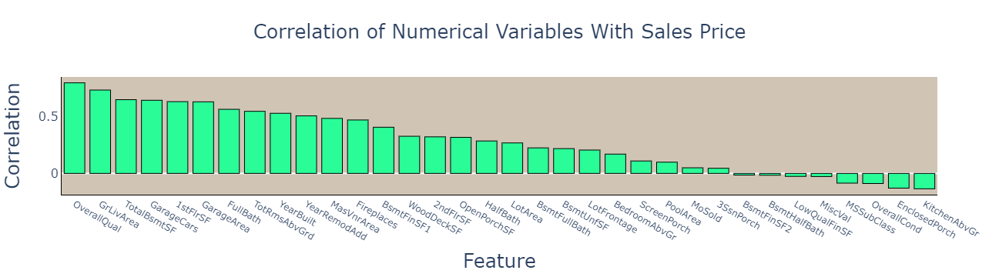

In [484]:
fig = px.bar(YY.iloc[0:34], x = 'Feature', y ='Correlation', title = 'Correlation of Numerical Variables With Sales Price', color_discrete_sequence = ['#2AFC98'])
fig.update_layout(
    barmode='stack', 
    xaxis_categoryorder = 'total descending',
    xaxis_title = 'Feature',
    yaxis_title = 'Correlation',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        showgrid = False,
        showline = True,
        linecolor = 'black'
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        showgrid = False,
        showline = True,
        linecolor = 'black'
    
    )
    
)
fig.update_traces(
    marker_line_width=1,
    marker_line_color="black"

)
fig

**There are a lot of area and square footage values with high correlation, perhaps we should combine like to a single metric**  

**Combine Counts of Various items to 1 metric**

### Action Plan  
+ Total Square footage = 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF'  
+ Outdoor Square Footage = '3SsnPorch', 'EnclosedPorch', 'WoodDeckSF, 'OpenPorchSF', 'ScreenPorch'  
+ Total Bathrooms = 'Fullbath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath'  


In [485]:
dfSQ = df.loc[:, ['SalePrice', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF' ]]
dfSQMelt = pd.melt(dfSQ, id_vars= 'SalePrice' )
dfSQMelt
FT = pd.DataFrame()
FT['SalePrice'] = dfSQMelt.SalePrice
FT['Feature'] = dfSQMelt.variable
FT['SquareFt'] = dfSQMelt.value
FT.sort_values('SalePrice')

,SalePrice,Feature,SquareFt
1932,34900,1stFlrSF,720
3374,34900,2ndFlrSF,0
490,34900,TotalBsmtSF,720
908,35311,TotalBsmtSF,480
3792,35311,2ndFlrSF,0
...,...,...,...
2613,745000,1stFlrSF,2411
4055,745000,2ndFlrSF,2065
2125,755000,1stFlrSF,2444
683,755000,TotalBsmtSF,2444


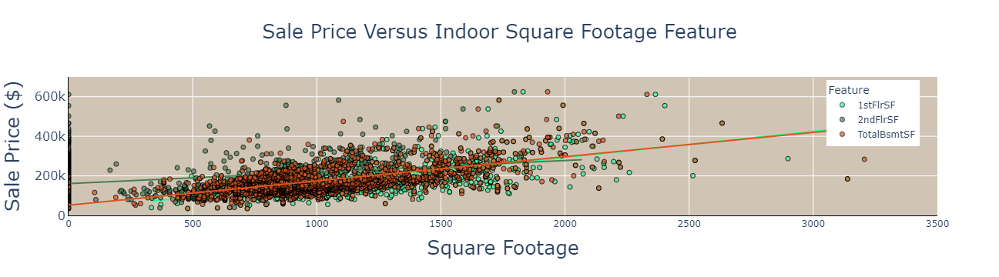

In [486]:

fig = px.scatter(FT.sort_values('SalePrice'), x = 'SquareFt', y ='SalePrice',
                 color = 'Feature',
                 title = 'Sale Price Versus Indoor Square Footage Feature',
                 color_discrete_sequence = ['#2AFC98', '#4B7F52','#DE541E' ],
                 trendline = 'ols',
                 opacity = 0.7,
                labels = {'variable':'Feature'}
                )
fig.update_layout(
    xaxis_title = 'Square Footage',
    yaxis_title = 'Sale Price ($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    autosize=True,

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        range = [0, 700000]
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black',
        range = [0, 3500]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6, line=dict(width=1, color='black')), selector=dict(mode='markers'))
fig

**The Bimodal nature of basement and 2nd floor skew the linear relationship of these variables, in the future find a method of seperating out observations with no basement or second floor**
**Let's try combing all these variable and see if we maintain a linear relationship**

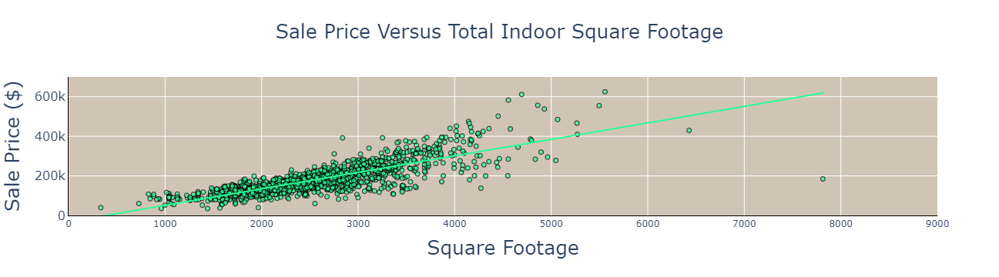

In [487]:
dfSQIn = pd.DataFrame(df['SalePrice'])
dfSQIn['IndoorSqFt'] = df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF']
fig = px.scatter(dfSQIn, x = 'IndoorSqFt', y ='SalePrice',title = 'Sale Price Versus Total Indoor Square Footage',
                         color_discrete_sequence = ['#2AFC98', '#4B7F52','#DE541E' ],
                 trendline = 'ols',
                 opacity = 0.7               
                )


fig.update_layout(
    xaxis_title = 'Square Footage',
    yaxis_title = 'Sale Price ($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        range = [0, 700000]
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [0, 9000]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig

**Dimentionality reduction and a strong linear relationship, that's a win**

### Let's Repeat with outdoor square footage

In [488]:
dfOutDoor = df.loc[:, ['SalePrice', '3SsnPorch', 'EnclosedPorch', 'WoodDeckSF', 'OpenPorchSF', 'ScreenPorch' ]]
dfOutDoorMelt = pd.melt(dfOutDoor, id_vars= 'SalePrice' )

In [489]:
import plotly.graph_objects as go

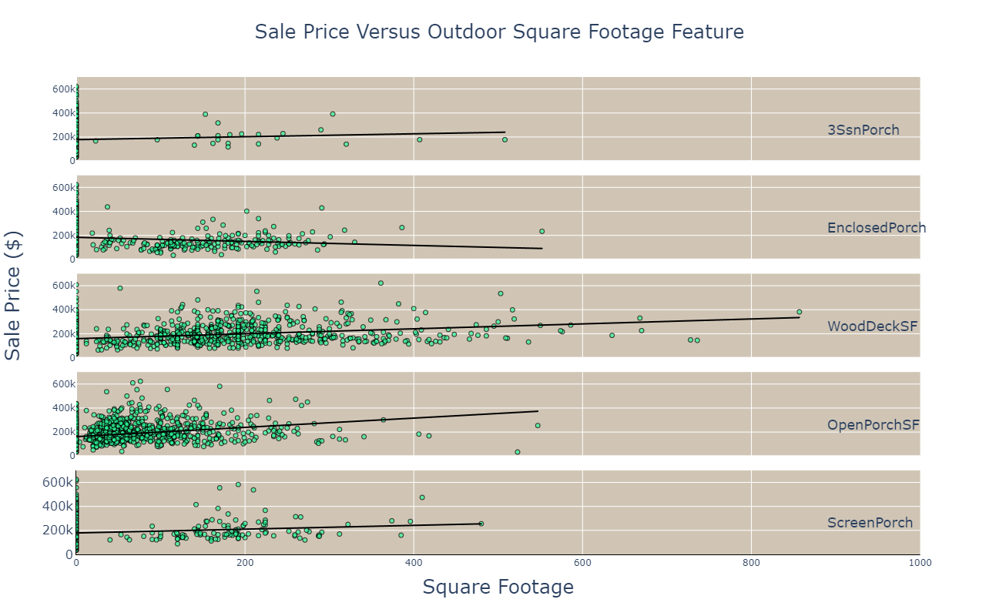

In [490]:
fig = px.scatter(dfOutDoorMelt, x = 'value', y ='SalePrice', facet_row = 'variable',title = 'Sale Price Versus Outdoor Square Footage Feature',
                         color_discrete_sequence = ['#2AFC98', '#4B7F52','#DE541E', '#D67AB1', '#B20D30'],
                 height = 800,
                 trendline = 'ols',
                 trendline_color_override="black",
                 opacity = 0.7,
                labels = {'variable':'Feature',                         
                         }
                )
for axis in fig.layout:
    if type(fig.layout[axis]) == go.layout.YAxis:
        fig.layout[axis].title.text = ''
    if type(fig.layout[axis]) == go.layout.XAxis:
        fig.layout[axis].title.text = ''
fig.update_layout(
    xaxis_title = 'Square Footage',
    yaxis_title = '.                                                               Sale Price ($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        title_standoff = 25,
        range = [0, 700000]
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [0, 1000]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(
    marker=dict(size=6,
                line=dict(width=1,
                color='black')
               ),
    selector=dict(mode='markers')
)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))
fig.update_annotations(font_size=18, textangle=0, x=.87, yanchor='top')

fig

**again we have bimodal nature on all features, with a strong representation of zeros**
**does adding all the features maintian a linear relationship?**

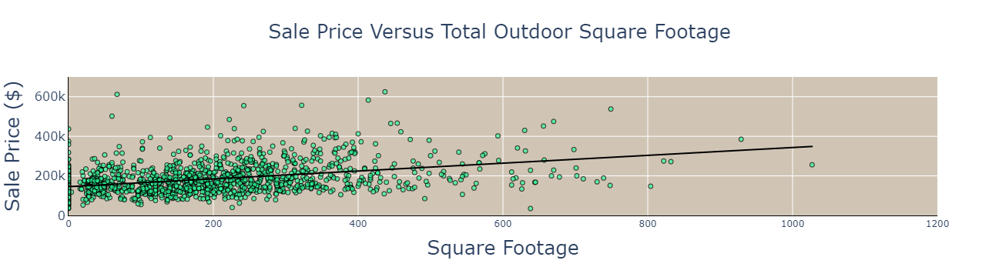

In [491]:
dfOutDoorAdd = pd.DataFrame(df['SalePrice'])
dfOutDoorAdd['OutDoorSQFT'] = df['3SsnPorch'] + df['EnclosedPorch'] + df['WoodDeckSF'] + df['OpenPorchSF'] + df['ScreenPorch']
fig = px.scatter(dfOutDoorAdd, x = 'OutDoorSQFT', y ='SalePrice',title = 'Sale Price Versus Total Outdoor Square Footage',
                         color_discrete_sequence = ['#2AFC98', '#4B7F52','#DE541E' ],
                 trendline = 'ols',
                 trendline_color_override="black",
                 opacity = 0.7               
                )


fig.update_layout(
    xaxis_title = 'Square Footage',
    yaxis_title = 'Sale Price ($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        range = [0, 700000]
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [0, 1200]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig

**Still a linear relationship, but high variance. Less zeros throwing off relationship**

## Does the same relationship hold true for bathrooms?

In [492]:
dfBathrooms = df.loc[:, ['SalePrice', 'FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath']]
dfBathroomsMelt = pd.melt(dfBathrooms, id_vars= 'SalePrice' )


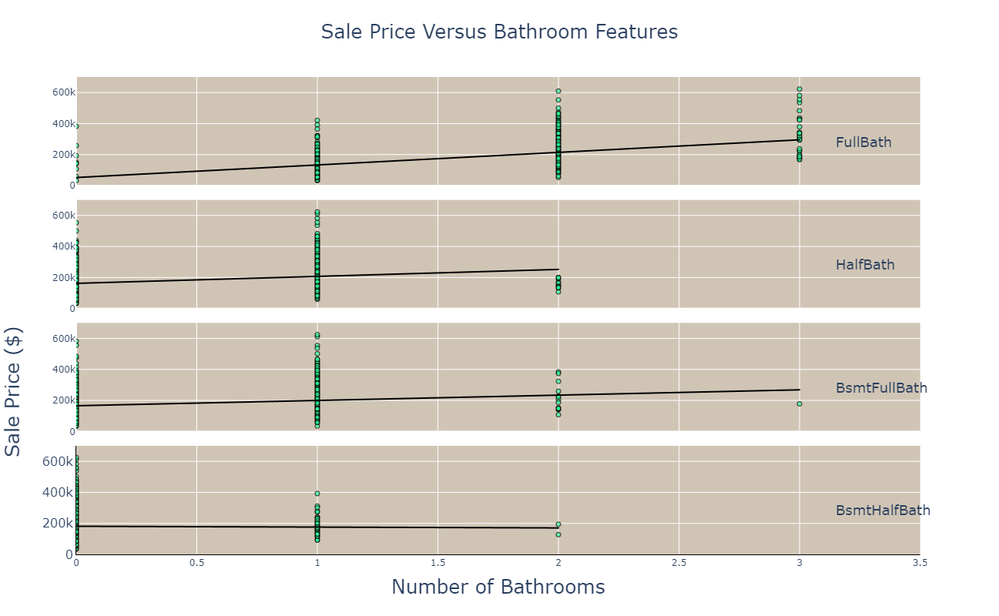

In [493]:
fig = px.scatter(dfBathroomsMelt, x = 'value', y ='SalePrice', facet_row = 'variable',title = 'Sale Price Versus Bathroom Features',
                         color_discrete_sequence = ['#2AFC98', '#4B7F52','#DE541E', '#D67AB1', '#B20D30'],
                 height = 800,
                 trendline = 'ols',
                 trendline_color_override="black",
                 opacity = 0.7,
                labels = {'variable':'Feature',                         
                         }
                )
for axis in fig.layout:
    if type(fig.layout[axis]) == go.layout.YAxis:
        fig.layout[axis].title.text = ''
    if type(fig.layout[axis]) == go.layout.XAxis:
        fig.layout[axis].title.text = ''
fig.update_layout(
    xaxis_title = 'Number of Bathrooms',
    yaxis_title = '.                               Sale Price ($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        title_standoff = 25,
        range = [0, 700000]
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [0, 3.5]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(
    marker=dict(size=6,
                line=dict(width=1,
                color='black')
               ),
    selector=dict(mode='markers')
)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))
fig.update_annotations(font_size=18, textangle=0, x=.88, yanchor='top')

fig

**Only Full baths seems to have a linear relationship, what happens if we combine them?**

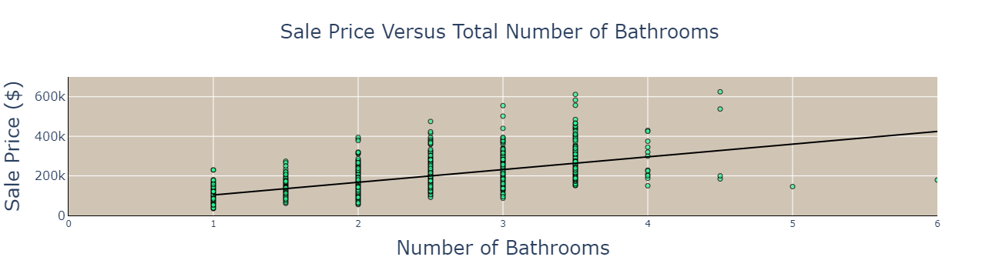

In [494]:
dfBathroomsAdd = pd.DataFrame(df['SalePrice'])
dfBathroomsAdd['TotalBathrooms'] = df['FullBath'] + 0.5 * df['HalfBath'] + df['BsmtFullBath'] + 0.5 * df['BsmtHalfBath']
fig = px.scatter(dfBathroomsAdd, x = 'TotalBathrooms', y ='SalePrice',title = 'Sale Price Versus Total Number of Bathrooms',
                         color_discrete_sequence = ['#2AFC98', '#4B7F52','#DE541E' ],
                 trendline = 'ols',
                 trendline_color_override="black",
                 opacity = 0.7               
                )


fig.update_layout(
    xaxis_title = 'Number of Bathrooms',
    yaxis_title = 'Sale Price ($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        range = [0, 700000]
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [0, 6]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig

**There is a linear relationship, I think it is worth doing**

In [495]:
df['TotSq'] = df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF']
df['OutSq'] = df['3SsnPorch'] + df['EnclosedPorch'] + df['WoodDeckSF'] + df['OpenPorchSF'] + df['ScreenPorch']
df['TotBr'] = df['FullBath'] + 0.5 * df['HalfBath'] + df['BsmtFullBath'] + 0.5 * df['BsmtHalfBath']
finalDF['TotSq'] = finalDF['TotalBsmtSF'] + finalDF['1stFlrSF'] + finalDF['2ndFlrSF']
finalDF['OutSq'] = finalDF['3SsnPorch'] + finalDF['EnclosedPorch'] + finalDF['WoodDeckSF'] + finalDF['OpenPorchSF'] + finalDF['ScreenPorch']
finalDF['TotBr'] = finalDF['FullBath'] + 0.5 * finalDF['HalfBath'] + finalDF['BsmtFullBath'] + 0.5 * finalDF['BsmtHalfBath']

### Check if relationship between new TotSq is the same as GrLiving Area

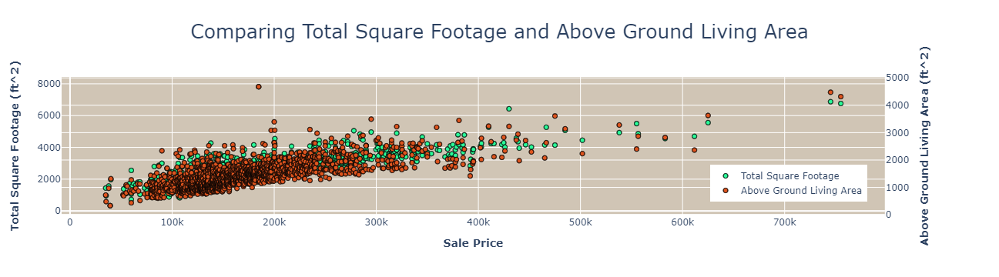

In [496]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x = df.sort_values('SalePrice').SalePrice, y = df.sort_values('SalePrice').TotSq, name = 'Total Square Footage', 
              mode='markers',
              marker=dict(
                  color = '#2AFC98'
              )
              ),
    secondary_y = False
)
fig.add_trace(
    go.Scatter( x = df.sort_values('SalePrice').SalePrice, y = df.sort_values('SalePrice').GrLivArea, name = 'Above Ground Living Area', mode='markers',
              marker=dict(
                  color = '#DE541E'
              )
              ),
   secondary_y = True  
)
fig.update_layout(
    title_text = 'Comparing Total Square Footage and Above Ground Living Area',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
        legend=dict(
        yanchor='bottom',
        y = .1,
        xanchor='right',
        x = 0.92
    ) 
)
fig.update_xaxes(title_text="<b>Sale Price</b>")
fig.update_yaxes(title_text="<b>Total Square Footage (ft^2)</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Above Ground Living Area (ft^2)</b>", secondary_y=True)
fig.write_image('C:/Users/jmeis/NYC_DSA/HousingPrices/Images/SquareFootageComparisons.png')
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig.show()

In [497]:
df.corr()['TotSq']

MSSubClass      -0.090233
LotFrontage      0.235054
LotArea          0.280398
OverallQual      0.679078
OverallCond     -0.153606
YearBuilt        0.356285
YearRemodAdd     0.347445
MasVnrArea       0.440395
BsmtFinSF1       0.359783
BsmtFinSF2       0.046419
BsmtUnfSF        0.394717
TotalBsmtSF      0.810185
1stFlrSF         0.789233
2ndFlrSF         0.341718
LowQualFinSF     0.010922
GrLivArea        0.869695
BsmtFullBath     0.173068
BsmtHalfBath    -0.008756
FullBath         0.592199
HalfBath         0.236468
BedroomAbvGr     0.365691
KitchenAbvGr     0.024549
TotRmsAbvGrd     0.678759
Fireplaces       0.471989
GarageCars       0.558410
GarageArea       0.555577
WoodDeckSF       0.290948
OpenPorchSF      0.325761
EnclosedPorch   -0.048702
3SsnPorch        0.039158
ScreenPorch      0.108269
PoolArea         0.076113
MiscVal         -0.041606
MoSold           0.059597
YrSold          -0.025605
SalePrice        0.822226
TotSq            1.000000
OutSq            0.395874
TotBr       

**Looks like my combined indoor square footage feature has the same relationship as GrLivArea, I feel confident dropping the latter**

In [498]:
df.drop(['GrLivArea'], axis =1, inplace = True)
finalDF.drop(['GrLivArea'], axis =1, inplace = True)

### Drop columns

In [499]:
droplist = ['TotalBsmtSF', '1stFlrSF', '2ndFlrSF', '3SsnPorch', 'EnclosedPorch', 'WoodDeckSF', 'OpenPorchSF', 'ScreenPorch', 'FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath']
df.drop(droplist, axis = 1, inplace = True)
finalDF.drop(droplist, axis = 1, inplace = True)
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,TotSq,OutSq,TotBr
0,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,...,None,0,2,2008,WD,Normal,208500,2566,61,3.5
1,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,...,None,0,5,2007,WD,Normal,181500,2524,298,2.5
2,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,...,None,0,9,2008,WD,Normal,223500,2706,42,3.5
3,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,...,None,0,2,2006,WD,Abnorml,140000,2473,307,2.0
4,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,...,None,0,12,2008,WD,Normal,250000,3343,276,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,None,Reg,Lvl,AllPub,Inside,...,None,0,8,2007,WD,Normal,175000,2600,40,2.5
1456,20,RL,85.0,13175,Pave,None,Reg,Lvl,AllPub,Inside,...,None,0,2,2010,WD,Normal,210000,3615,349,3.0
1457,70,RL,66.0,9042,Pave,None,Reg,Lvl,AllPub,Inside,...,Shed,2500,5,2010,WD,Normal,266500,3492,60,2.0
1458,20,RL,68.0,9717,Pave,None,Reg,Lvl,AllPub,Inside,...,None,0,4,2010,WD,Normal,142125,2156,478,2.0


#### Idea, combine all quality metrics into a single quality converting text to ordinal weighted by correlation

In [500]:
QualityCols = ['OverallQual','OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'KitchenQual', 'FireplaceQu', 'GarageQual', 'GarageCond', 'PoolQC' ]

**Some condition columns are nominal convert to ordinal with a lowest value of 0 Highest of 10**

In [501]:
## ExterQual

replaceDict = {'Ex': 10, 'Gd':8, 'TA': 6, 'Fa':4, 'Po':2, 'None': 0}
df = df.replace({'ExterQual': replaceDict})
finalDF = finalDF.replace({'ExterQual': replaceDict})
print(df.ExterQual.value_counts(), finalDF.ExterQual.value_counts())


6     893
8     486
10     50
4      13
Name: ExterQual, dtype: int64 6     884
8     491
10     55
4      18
Name: ExterQual, dtype: int64


In [502]:
## ExterCond
df = df.replace({'ExterCond': replaceDict})
finalDF = finalDF.replace({'ExterCond': replaceDict})
df.ExterCond.value_counts()

6     1268
8      145
4       27
10       2
Name: ExterCond, dtype: int64

In [503]:
## BsmtQual

df = df.replace({'BsmtQual': replaceDict})
finalDF = finalDF.replace({'BsmtQual': replaceDict})
df.BsmtQual.value_counts()

6     641
8     612
10    120
0      35
4      34
Name: BsmtQual, dtype: int64

In [504]:
## BsmtCond
replaceDict = {'Ex': 10, 'Gd':8, 'TA': 6, 'Fa':4, 'Po':2, 'None': 0}
df = df.replace({'BsmtCond': replaceDict})
finalDF = finalDF.replace({'BsmtCond': replaceDict})
df.BsmtCond.value_counts()

6    1296
8      65
4      45
0      35
2       1
Name: BsmtCond, dtype: int64

In [505]:
# GarageQual
df = df.replace({'GarageQual': replaceDict})
finalDF = finalDF.replace({'GarageQual': replaceDict})
df.GarageQual.value_counts()

6     1297
0       79
4       48
8       13
10       3
2        2
Name: GarageQual, dtype: int64

In [506]:
# GarageCond
df = df.replace({'GarageCond': replaceDict})
finalDF = finalDF.replace({'GarageCond': replaceDict})
df.GarageCond.value_counts()

6     1313
0       79
4       33
8        9
2        6
10       2
Name: GarageCond, dtype: int64

In [507]:
#KitchenQual
df = df.replace({'KitchenQual': replaceDict})
finalDF = finalDF.replace({'KitchenQual': replaceDict})
df.KitchenQual.value_counts()

6     724
8     581
10     99
4      38
Name: KitchenQual, dtype: int64

In [508]:
# FireplaceQu
df = df.replace({'FireplaceQu': replaceDict})
finalDF = finalDF.replace({'FireplaceQu': replaceDict})
df.FireplaceQu.value_counts()

0     682
8     377
6     308
4      32
10     24
2      19
Name: FireplaceQu, dtype: int64

In [509]:
# PoolQC
df = df.replace({'PoolQC': replaceDict})
finalDF = finalDF.replace({'PoolQC': replaceDict})
df.PoolQC.value_counts()

0     1437
10       2
8        2
4        1
Name: PoolQC, dtype: int64

## Let's Graph our new numerical quality variables against sale price and see if there are linear relationships

In [510]:
dfQualAll = df.loc[:,['SalePrice','OverallQual','ExterQual','BsmtQual', 'KitchenQual', 'FireplaceQu', 'GarageQual','PoolQC']]
dfQualMelt = pd.melt(dfQualAll, id_vars='SalePrice')
dfQualMelt
dfCondAll = df.loc[:,['SalePrice','OverallCond', 'ExterCond', 'BsmtCond', 'GarageCond']]
dfCondMelt = pd.melt(dfCondAll, id_vars='SalePrice')


In [511]:
snip1 = pd.DataFrame(dfQualAll.corr()['SalePrice'].iloc[1:]).reset_index()
snip1.columns = ['Feature', 'Correlation']
snip1.sort_values('Correlation', ascending=False)

,Feature,Correlation
0,OverallQual,0.792129
1,ExterQual,0.684333
3,KitchenQual,0.660592
2,BsmtQual,0.586866
4,FireplaceQu,0.518023
5,GarageQual,0.268863
6,PoolQC,0.122663


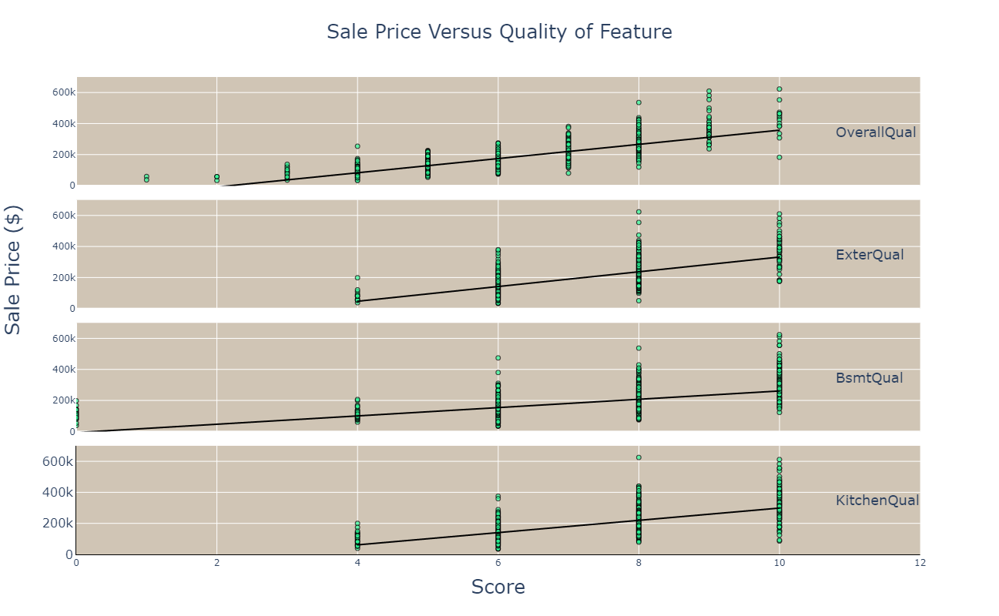

In [512]:
fig = px.scatter(dfQualMelt.loc[dfQualMelt['variable'].isin(['OverallQual','ExterQual', 'BsmtQual', 'KitchenQual'])], x = 'value', y ='SalePrice', facet_row = 'variable',title = 'Sale Price Versus Quality of Feature',
                         color_discrete_sequence = ['#2AFC98', '#4B7F52','#DE541E', '#D67AB1', '#B20D30'],
                 width=1200, height=800,
                 trendline='ols',
                 trendline_color_override="black",
                 opacity = 0.7,
                labels = {'variable':'Feature',                         
                         }
                )
for axis in fig.layout:
    if type(fig.layout[axis]) == go.layout.YAxis:
        fig.layout[axis].title.text = ''
    if type(fig.layout[axis]) == go.layout.XAxis:
        fig.layout[axis].title.text = ''
fig.update_layout(
    xaxis_title = 'Score',
    yaxis_title = '.                                                                   Sale Price ($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        title_standoff = 25,
        range = [0, 700000]
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [0, 12]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(
    marker=dict(size=6,
                line=dict(width=1,
                color='black')
               ),
    selector=dict(mode='markers')
)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))
fig.update_annotations(font_size=18, textangle=0,x = 0.88)

fig

**Fireplace, Garage Quality and Pool Quality Do not seem to have a linear relationshipi to price, drop them**

In [513]:
snip2 = dfCondAll.corr()[['SalePrice']].reset_index().iloc[1:].sort_values('SalePrice', ascending = False)
snip2.columns=['Feature', 'Correlation']
snip2

,Feature,Correlation
4,GarageCond,0.257851
3,BsmtCond,0.206717
2,ExterCond,0.004743
1,OverallCond,-0.088405


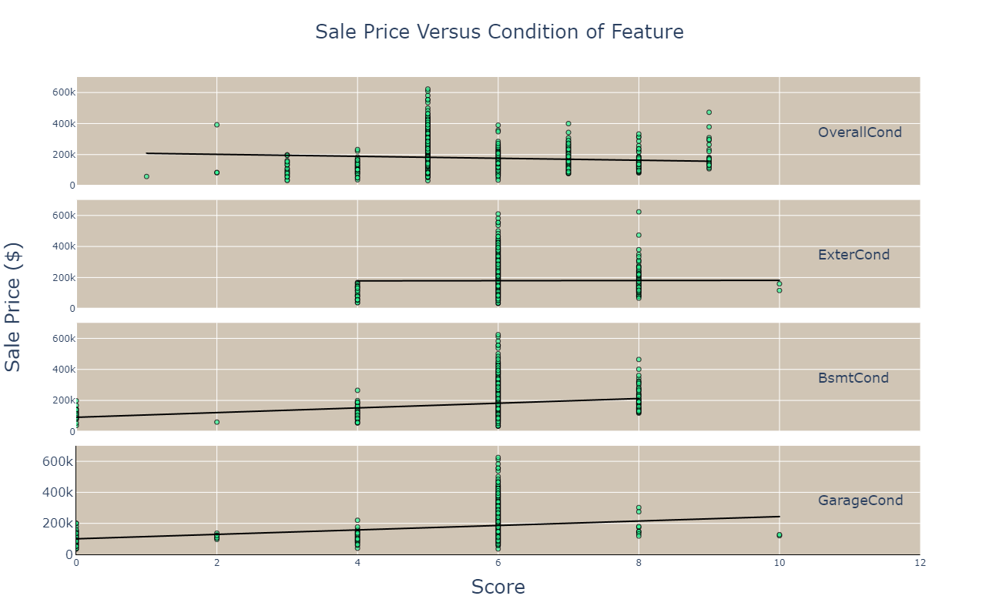

In [514]:
fig = px.scatter(dfCondMelt, x = 'value', y ='SalePrice', facet_row = 'variable',title = 'Sale Price Versus Condition of Feature',
                         color_discrete_sequence = ['#2AFC98', '#4B7F52','#DE541E', '#D67AB1', '#B20D30'],
                 width=1200, height=800,
                 trendline='ols',
                 trendline_color_override='black',
                 opacity = 0.7,
                labels = {'variable':'Feature',                         
                         }
                )
for axis in fig.layout:
    if type(fig.layout[axis]) == go.layout.YAxis:
        fig.layout[axis].title.text = ''
    if type(fig.layout[axis]) == go.layout.XAxis:
        fig.layout[axis].title.text = ''
fig.update_layout(
    xaxis_title = 'Score',
    yaxis_title = '.                                                        Sale Price ($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        title_standoff = 25,
        range = [0, 700000]
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [0, 12]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(
    marker=dict(size=6,
                line=dict(width=1,
                color='black')
               ),
    selector=dict(mode='markers')
)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))
fig.update_annotations(font_size=18, textangle=0,x = 0.86)

fig

**None of the condition columns have a linear relationship with price, drop them all**

### Determine correlation of new numeric Columns

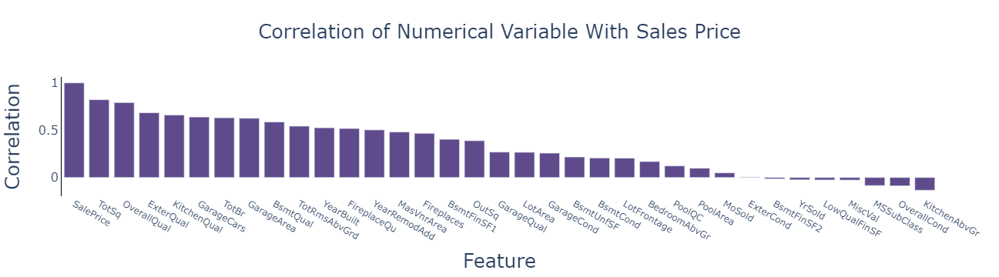

In [515]:
fig = px.bar(x = df.corr().index, y =df.corr().SalePrice,
            title = 'Correlation of Numerical Variable With Sales Price',
             color_discrete_sequence = ['#5F4B8B']
            )
fig.update_layout(
    barmode='stack', 
    xaxis_categoryorder = 'total descending',
    xaxis_title = 'Feature',
    yaxis_title = 'Correlation',
    title_x=0.5,
    plot_bgcolor = 'white',
    title_font = dict(size = 25),
    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        showgrid = False,
        showline = True,
        linecolor = 'black'
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        showgrid = False,
        showline = False,
        linecolor = 'black'
        
    )
    
)
fig

**Looks like the quality variables are more impactful in general than the condition ones, but I don't think we can combine them without introducing error**

### Drop Old Qual and Cond Columns

In [516]:
for i in ['OverallCond','ExterCond', 'BsmtCond', 'FireplaceQu', 'GarageQual', 'GarageCond', 'PoolQC']:
    df.drop(i, axis = 1, inplace = True)
    finalDF.drop(i, axis = 1, inplace = True)

In [517]:
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,TotSq,OutSq,TotBr
0,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,...,None,0,2,2008,WD,Normal,208500,2566,61,3.5
1,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,...,None,0,5,2007,WD,Normal,181500,2524,298,2.5
2,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,...,None,0,9,2008,WD,Normal,223500,2706,42,3.5
3,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,...,None,0,2,2006,WD,Abnorml,140000,2473,307,2.0
4,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,...,None,0,12,2008,WD,Normal,250000,3343,276,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,None,Reg,Lvl,AllPub,Inside,...,None,0,8,2007,WD,Normal,175000,2600,40,2.5
1456,20,RL,85.0,13175,Pave,None,Reg,Lvl,AllPub,Inside,...,None,0,2,2010,WD,Normal,210000,3615,349,3.0
1457,70,RL,66.0,9042,Pave,None,Reg,Lvl,AllPub,Inside,...,Shed,2500,5,2010,WD,Normal,266500,3492,60,2.0
1458,20,RL,68.0,9717,Pave,None,Reg,Lvl,AllPub,Inside,...,None,0,4,2010,WD,Normal,142125,2156,478,2.0


## Convert GarageYrBlt to numeric

### Convert None Values to 0

In [518]:
df.loc[df['GarageYrBlt']=='None','GarageYrBlt' ] = 0
finalDF.loc[finalDF['GarageYrBlt']=='None','GarageYrBlt' ] = 0

In [519]:
df.GarageYrBlt = pd.to_numeric(df.GarageYrBlt)
finalDF.GarageYrBlt = pd.to_numeric(finalDF.GarageYrBlt)

In [520]:
df.GarageYrBlt

0       2003.0
1       1976.0
2       2001.0
3       1998.0
4       2000.0
         ...  
1455    1999.0
1456    1978.0
1457    1941.0
1458    1950.0
1459    1965.0
Name: GarageYrBlt, Length: 1442, dtype: float64

In [521]:
filtLis = ['BedroomAbvGr','KitchenAbvGr','LowQualFinSF', 'GarageYrBlt','BsmtUnfSF', 'BsmtFinSF2','MoSold', 'PoolArea']
snip4 = df.corr()[['SalePrice']].sort_values('SalePrice', ascending = False).iloc[1:].loc[filtLis].sort_values('SalePrice', ascending = False).reset_index()
snip4.columns = ['Feature', 'Correlation']
snip4
#

,Feature,Correlation
0,GarageYrBlt,0.259369
1,BsmtUnfSF,0.217009
2,BedroomAbvGr,0.168823
3,PoolArea,0.098241
4,MoSold,0.049140
5,BsmtFinSF2,-0.014524
6,LowQualFinSF,-0.026075
7,KitchenAbvGr,-0.134535


## Check for linear relationship with Garage Year Built Column

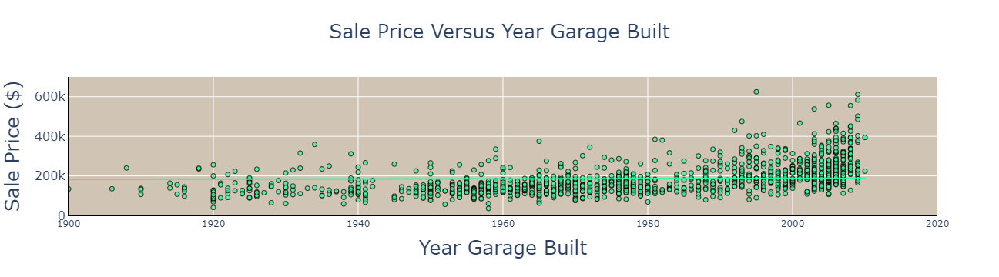

In [522]:
fig = px.scatter(df, x = 'GarageYrBlt', y ='SalePrice',title = 'Sale Price Versus Year Garage Built',
                         color_discrete_sequence = ['#2AFC98', '#4B7F52','#DE541E' ],
                 trendline = 'ols',
                 opacity = 0.7               
                )


fig.update_layout(
    xaxis_title = 'Year Garage Built',
    yaxis_title = 'Sale Price ($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        range = [0, 700000]
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [1900, 2020]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig

**Not a linear relationship, drop column**

In [523]:
df.drop(['GarageYrBlt'], axis =1, inplace = True)
finalDF.drop(['GarageYrBlt'], axis =1, inplace = True)

## Convert Basement Finished and Unfinished Sq ft to percentage finished sq ft

In [524]:
df['BsmtPerFin'] = (df['BsmtFinSF1'] + df['BsmtFinSF2']) / (df['BsmtUnfSF']+ df['BsmtFinSF1'] + df['BsmtFinSF2'])
finalDF['BsmtPerFin'] = (finalDF['BsmtFinSF1'] + finalDF['BsmtFinSF2']) / (finalDF['BsmtUnfSF']+ finalDF['BsmtFinSF1'] + finalDF['BsmtFinSF2'])

**Drop the previous 3 columns**

In [525]:
df = df.drop(['BsmtFinSF2', 'BsmtFinSF1', 'BsmtUnfSF'], axis = 1)
finalDF = finalDF.drop(['BsmtFinSF2', 'BsmtFinSF1', 'BsmtUnfSF'], axis = 1)

**Convert Nans in new columns to zeros**

In [526]:
df['BsmtPerFin'] = df['BsmtPerFin'].fillna(0)
finalDF['BsmtPerFin'] = finalDF['BsmtPerFin'].fillna(0)

**This improves R Squared of EleasticNet Model from 86.1 to 86.7%**

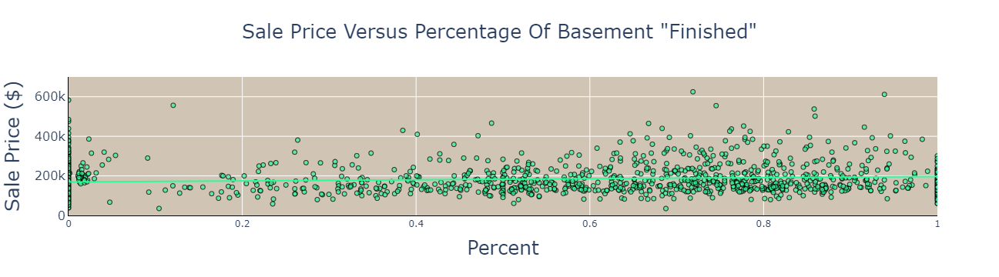

In [527]:
fig = px.scatter(df, x = 'BsmtPerFin', y ='SalePrice',title = 'Sale Price Versus Percentage Of Basement "Finished"',
                         color_discrete_sequence = ['#2AFC98', '#4B7F52','#DE541E' ],
                 trendline = 'ols',
                 opacity = 0.7               
                )


fig.update_layout(
    xaxis_title = 'Percent',
    yaxis_title = 'Sale Price ($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        range = [0, 700000]
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [0,1]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig

**no linear relationship, drop column**

In [528]:
df.drop(['BsmtPerFin'], axis = 1, inplace = True)
finalDF.drop(['BsmtPerFin'], axis = 1, inplace = True)

## Convert Basement Quality columns to numeric and average the two

In [529]:
df.BsmtFinType1.value_counts()

Unf     426
GLQ     413
ALQ     218
BLQ     146
Rec     132
LwQ      72
None     35
Name: BsmtFinType1, dtype: int64

In [530]:
replaceDict2 = {'None' : 0, 'Unf' : 1, 'LwQ' : 2, 'Rec' : 3, 'BLQ' : 4, 'ALQ' : 5, 'GLQ': 6}


In [531]:
df = df.replace({'BsmtFinType1': replaceDict2, 'BsmtFinType2': replaceDict2})
finalDF = finalDF.replace({'BsmtFinType1': replaceDict2, 'BsmtFinType2': replaceDict2})


In [532]:
df.loc[:,['BsmtFinType1', 'BsmtFinType2']].value_counts()

BsmtFinType1  BsmtFinType2
1             1               426
6             1               389
5             1               165
4             1               111
3             1               109
2             1                46
0             0                35
5             3                21
              4                15
4             3                15
5             2                15
4             2                12
3             4                11
6             2                10
2             5                 9
3             2                 8
6             3                 7
2             3                 7
              6                 6
4             6                 5
6             5                 4
3             5                 4
2             4                 4
5             6                 2
4             5                 2
6             4                 2
              0                 1
4             4                 1
dtype: int64

**Let's look at relationship between basement quality types and house price**

In [533]:
dfBasement = df.loc[:,['SalePrice', 'BsmtFinType1', 'BsmtFinType2']]
dfBaseMelt = pd.melt(dfBasement, id_vars='SalePrice')
dfBaseMelt


,SalePrice,variable,value
0,208500,BsmtFinType1,6
1,181500,BsmtFinType1,5
2,223500,BsmtFinType1,6
3,140000,BsmtFinType1,5
4,250000,BsmtFinType1,6
...,...,...,...
2879,175000,BsmtFinType2,1
2880,210000,BsmtFinType2,3
2881,266500,BsmtFinType2,1
2882,142125,BsmtFinType2,3


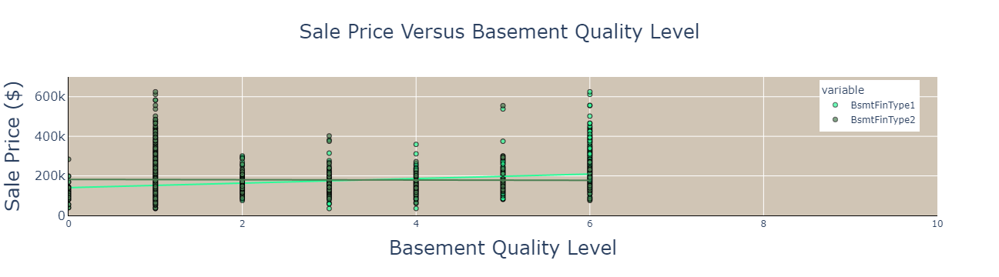

In [534]:
fig = px.scatter(dfBaseMelt, x = 'value', y ='SalePrice',color = 'variable', title = 'Sale Price Versus Basement Quality Level',
                         color_discrete_sequence = ['#2AFC98', '#4B7F52','#DE541E' ],
                 trendline = 'ols',
                 opacity = 0.7               
                )


fig.update_layout(
    xaxis_title = 'Basement Quality Level',
    yaxis_title = 'Sale Price ($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        range = [0, 700000]
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [0,10]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig

**There Doesn't seem to be a linear relationship here**
**What about on a combined Value**

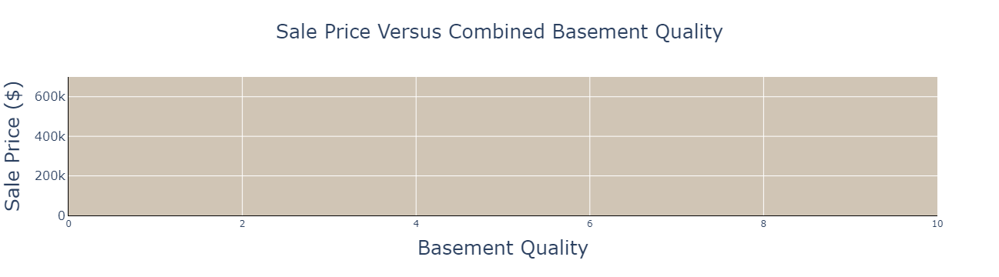

In [535]:
fig = px.scatter(df, x = df.BsmtFinType1 + df.BsmtFinType2, y ='SalePrice',title = 'Sale Price Versus Combined Basement Quality',
                         color_discrete_sequence = ['#2AFC98', '#4B7F52','#DE541E' ],
                 trendline = 'ols',
                 opacity = 0.7               
                )


fig.update_layout(
    xaxis_title = 'Basement Quality',
    yaxis_title = 'Sale Price ($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        range = [0, 700000]
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [0,10]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig

**Any Linear Combination of Values Produces the Same Relationship**

In [536]:
df['BsmtFinish'] = df['BsmtFinType1'] + df['BsmtFinType2']
finalDF['BsmtFinish'] = finalDF['BsmtFinType1'] + finalDF['BsmtFinType2']
df = df.drop(['BsmtFinType1', 'BsmtFinType2'], axis = 1)
finalDF = finalDF.drop(['BsmtFinType1', 'BsmtFinType2'], axis = 1)
df.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'Foundation', 'BsmtQual', 'BsmtExposure', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'LowQualFinSF', 'BedroomAbvGr',
       'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional',
       'Fireplaces', 'GarageType', 'GarageFinish', 'GarageCars', 'GarageArea',
       'PavedDrive', 'PoolArea', 'Fence', 'MiscFeature', 'MiscVal', 'MoSold',
       'YrSold', 'SaleType', 'SaleCondition', 'SalePrice', 'TotSq', 'OutSq',
       'TotBr', 'BsmtFinish'],
      dtype='object')

**Trivial Drop to 86.6 from 86.7, still think its worth it to simplify model**

## Let's Look at VIF data and see if we can eliminate some columns

In [537]:
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
vif_data = pd.DataFrame()
J = df.drop(['SalePrice'], axis =1)
J = J.select_dtypes(['number'])
vif_data['Feature'] = J.columns
vif_data['VIF'] = [vif(J.values, i) for i in range(len(J.columns))]
vif_data.loc[vif_data['VIF']>1000]

,Feature,VIF
4,YearBuilt,11648.194337
5,YearRemodAdd,19672.494145
20,YrSold,22378.343953


## Year Columns (YearBuilt, YearRemodAdd, YrSold) Have Very High VIF, let's Simplify

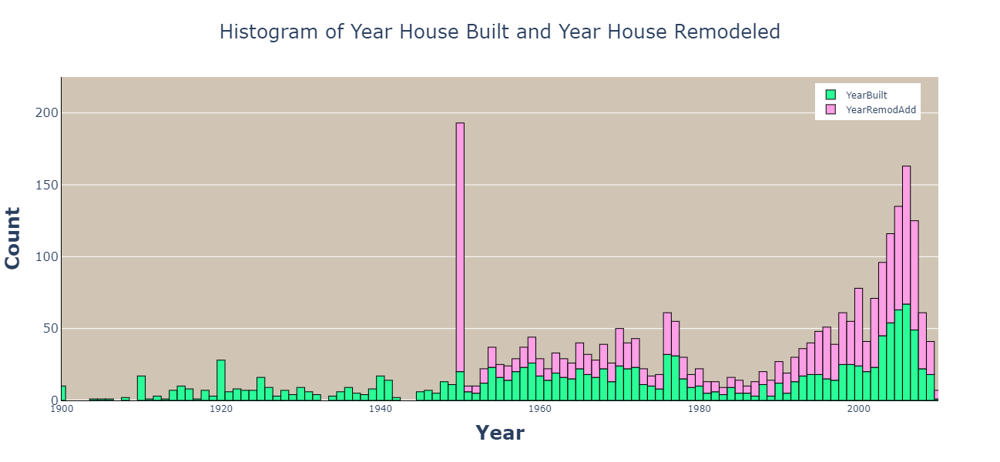

In [538]:
dfYearMelt = df[['YearBuilt', 'YearRemodAdd', 'SalePrice']]
dfYearMelt = pd.melt(dfYearMelt, id_vars='SalePrice')
dfYearMelt
fig = px.histogram(dfYearMelt, x = 'value', color = 'variable', nbins = 200, color_discrete_sequence=['#2AFC98','#FF9FE5' ],
                  title = 'Histogram of Year House Built and Year House Remodeled',
                   height = 600,
                   labels = {
                       'variable':''
                   }
                  )
fig.update_layout(
    xaxis_title = 'Year',
    yaxis_title = 'Count',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    bargap = 0.01,

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        range = [0,225]

    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [1900,2010]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(
    marker_line_width=1,
    marker_line_color="black"

)
fig.update_xaxes(title_text = '<b>Year</b>')
fig.update_yaxes(title_text = '<b>Count</b>')
fig.write_image('C:/Users/jmeis/NYC_DSA/HousingPrices/Images/YearDistribution.png')
fig

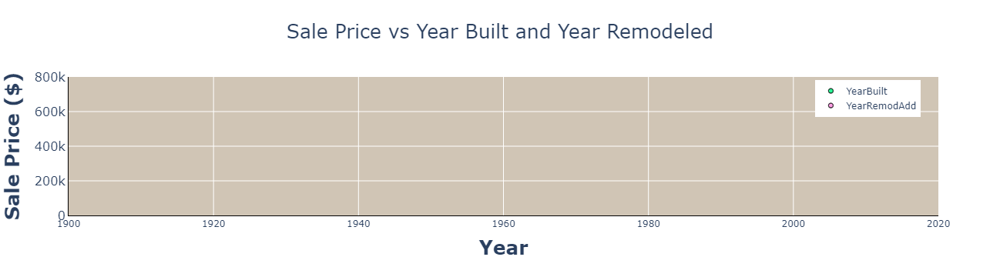

In [539]:
dfSort = dfYearMelt.sort_values('SalePrice')
dfSort
fig = px.scatter(dfSort, x= 'value', y = 'SalePrice', color = 'variable', color_discrete_sequence=['#2AFC98','#FF9FE5' ],
                  title = 'Sale Price vs Year Built and Year Remodeled',
                   labels = {
                       'variable':''
                   },
                 trendline='ols',
                 trendline_color_override="black"
                  )
fig.update_layout(
    xaxis_title = 'Year',
    yaxis_title = 'Count',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
 
    bargap = 0.01,

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        range = [0,800000]

    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [1900,2020]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig.update_xaxes(title_text = '<b>Year</b>')
fig.update_yaxes(title_text = '<b>Sale Price ($)</b>')
fig.write_image('C:/Users/jmeis/NYC_DSA/HousingPrices/Images/YearBySalePrice.png')
fig

**We see very similar distributions of Year Remod Add and Year Built, let's graph the difference between the two for age of house**

In [540]:
df['YearRemodAdd'] - df['YearBuilt']

0        0
1        0
2        1
3       55
4        0
        ..
1455     1
1456    10
1457    65
1458    46
1459     0
Length: 1442, dtype: int64

**Why am I seeing zeros, do they change the year the house was built when they remoddel?**

In [541]:
df.loc[df['YearBuilt'] == df['YearRemodAdd'], ['YearBuilt', 'YearRemodAdd']]

,YearBuilt,YearRemodAdd
0,2003,2003
1,1976,1976
4,2000,2000
7,1973,1973
10,1965,1965
...,...,...
1449,1970,1970
1450,1974,1974
1452,2005,2005
1453,2006,2006


**Nope, if a House was never rebuilt they fill the YearRemodAdd with the year built**

In [542]:
df.loc[df['YearBuilt'] != df['YearRemodAdd'], ['YearBuilt', 'YearRemodAdd']]

,YearBuilt,YearRemodAdd
2,2001,2002
3,1915,1970
5,1993,1995
6,2004,2005
8,1931,1950
...,...,...
1454,2004,2005
1455,1999,2000
1456,1978,1988
1457,1941,2006


**Year Built may be a redundant Column, let's add a binary identifier if a house has been remodeled, and graph YearRemodAdd vs Sale price for the two groups**

In [543]:
df['RemodYN'] = np.where(df['YearBuilt'] == df['YearRemodAdd'], 'No', 'Yes')
finalDF['RemodYN'] = np.where(finalDF['YearBuilt'] == finalDF['YearRemodAdd'], 'No', 'Yes')
df.RemodYN.value_counts()

No     757
Yes    685
Name: RemodYN, dtype: int64

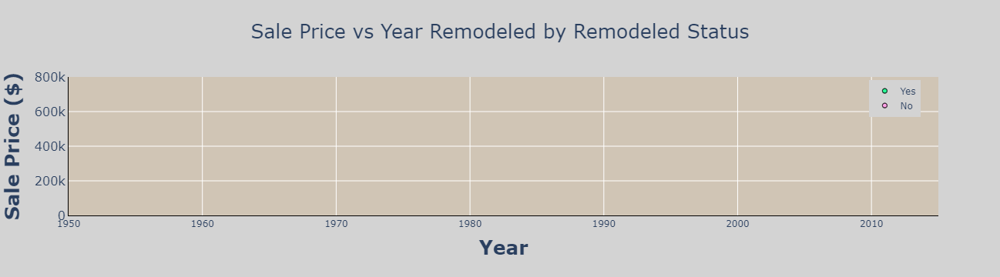

In [544]:
dfSort = df.sort_values('SalePrice')
dfSort
fig = px.scatter(dfSort, x= 'YearRemodAdd', y = 'SalePrice',color = 'RemodYN',color_discrete_sequence=['#2AFC98','#FF9FE5' ],
                  title = 'Sale Price vs Year Remodeled by Remodeled Status',
                   labels = {
                       'RemodYN':''
                   },
                 trendline='ols',
                 trendline_color_override="black"
                  )
fig.update_layout(
    xaxis_title = 'Year',
    yaxis_title = 'Count',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    paper_bgcolor = 'lightgray',
    bargap = 0.01,

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        range = [0,800000]

    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [1950,2015]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig.update_xaxes(title_text = '<b>Year</b>')
fig.update_yaxes(title_text = '<b>Sale Price ($)</b>')
fig.write_image('C:/Users/jmeis/NYC_DSA/HousingPrices/Images/RemodeledDiff.png')
fig

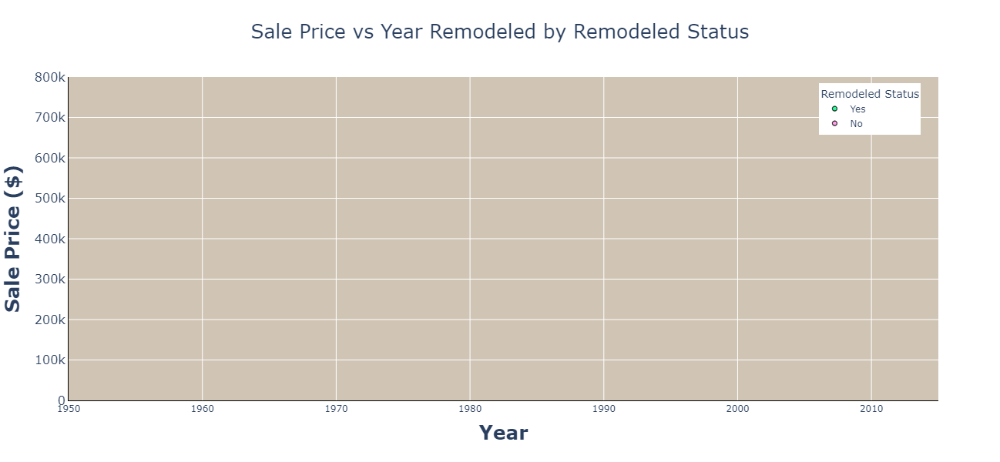

In [545]:
dfSort = df.sort_values('SalePrice')
dfSort
fig = px.scatter(dfSort, x= 'YearBuilt', y = 'SalePrice',color = 'RemodYN',color_discrete_sequence=['#2AFC98','#FF9FE5' ],
                  title = 'Sale Price vs Year Remodeled by Remodeled Status',
                   labels = {
                       'RemodYN':'Remodeled Status'
                   },
                 trendline='ols',
                 trendline_color_override='black',
                 height = 600,
                 width = 850
                 
                  )
fig.update_layout(
    xaxis_title = 'Year',
    yaxis_title = 'Count',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
 
    bargap = 0.01,

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        range = [0,800000]

    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [1950,2015]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig.update_xaxes(title_text = '<b>Year</b>')
fig.update_yaxes(title_text = '<b>Sale Price ($)</b>')
fig.write_image('C:/Users/jmeis/NYC_DSA/HousingPrices/Images/BuiltDiff.png')
fig

**Weak linear relationship exists between year remodeled and there is a slight change in relationship based on remodeled status**  

**Let's drop year house built column and keep the remodled Yes , no column**

In [546]:
df.drop(['YearBuilt'], axis =1, inplace = True)
finalDF.drop(['YearBuilt'], axis =1, inplace = True)

## Check VIF data Again

In [547]:
vif_data = pd.DataFrame()
J = df.drop(['SalePrice'], axis =1)
J = J.select_dtypes(['number'])
vif_data['Feature'] = J.columns
vif_data['VIF'] = [vif(J.values, i) for i in range(len(J.columns))]
vif_data

,Feature,VIF
0,MSSubClass,3.645996
1,LotFrontage,6.814224
2,LotArea,5.232612
3,OverallQual,75.446809
4,YearRemodAdd,18624.376459
5,MasVnrArea,1.774158
6,ExterQual,103.911260
7,BsmtQual,39.736829
8,LowQualFinSF,1.088475
9,BedroomAbvGr,29.577964


In [548]:
vif_data.loc[vif_data['Feature'].isin(['GarageCars', 'GarageArea'])]

,Feature,VIF
14,GarageCars,36.230931
15,GarageArea,30.655436


**Dropping Year built gives me a whole percentage point on R Squared to 87.7**

## Garage Variables

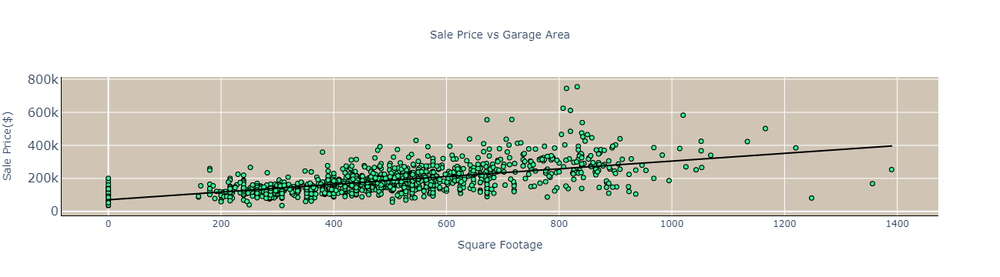

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.392
Model:                            OLS   Adj. R-squared:                  0.392
Method:                 Least Squares   F-statistic:                     929.2
Date:                Fri, 29 Apr 2022   Prob (F-statistic):          6.90e-158
Time:                        16:33:02   Log-Likelihood:                -17956.
No. Observations:                1442   AIC:                         3.592e+04
Df Residuals:                    1440   BIC:                         3.593e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        7.04e+04   3981.552     17.681      0.0

In [549]:
fig = px.scatter(df, x= 'GarageArea', y = 'SalePrice',color_discrete_sequence=['#2AFC98','#FF9FE5' ],
                  title = 'Sale Price vs Garage Area',                   
                 trendline='ols',
                 width = 550,
                 height = 250,
                 trendline_color_override="black"
                  )
fig.update_layout(
    xaxis_title = 'Square Footage',
    yaxis_title = 'Sale Price($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 14),
    bargap = 0.01,

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 14),
        linecolor = 'black'
    

    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =14),
        linecolor = 'black'  

    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig.show()
results = px.get_trendline_results(fig)
results = results.iloc[0]["px_fit_results"].summary()
print(results)

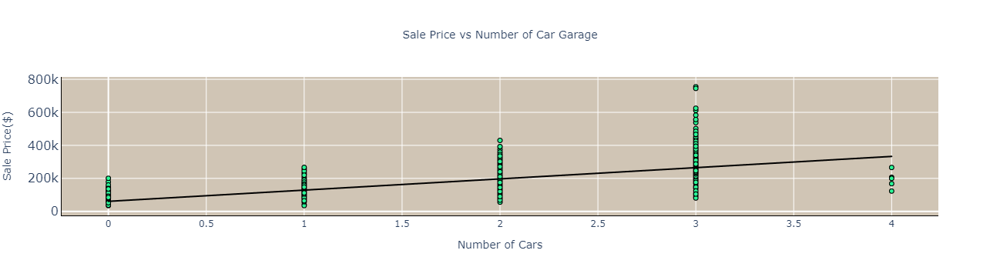

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.409
Model:                            OLS   Adj. R-squared:                  0.409
Method:                 Least Squares   F-statistic:                     997.3
Date:                Fri, 29 Apr 2022   Prob (F-statistic):          9.21e-167
Time:                        16:33:02   Log-Likelihood:                -17935.
No. Observations:                1442   AIC:                         3.587e+04
Df Residuals:                    1440   BIC:                         3.589e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       6.084e+04   4134.113     14.717      0.0

In [550]:
fig = px.scatter(df, x= 'GarageCars', y = 'SalePrice',color_discrete_sequence=['#2AFC98','#FF9FE5' ],
                  title = 'Sale Price vs Number of Car Garage',                   
                 trendline='ols',
                 width = 550,
                 height = 250,
                 trendline_color_override="black"
                  )
fig.update_layout(
    xaxis_title = 'Number of Cars',
    yaxis_title = 'Sale Price($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 14),
    bargap = 0.01,

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 14),
        linecolor = 'black'
    

    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =14),
        linecolor = 'black'  

    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig.show()
results = px.get_trendline_results(fig)
results = results.iloc[0]["px_fit_results"].summary()
print(results)


**Garage Area is too closely related to Garage # of Cars, which seems to be the better correlated value**

In [551]:
df = df.drop(['GarageArea'], axis = 1)
finalDF = finalDF.drop(['GarageArea'], axis = 1)

**Same R Squared 87.7d**

## DropTotal Rooms, same info as number of bedrooms and Kitchens

In [552]:
df = df.drop(['TotRmsAbvGrd'], axis =1)
finalDF = finalDF.drop(['TotRmsAbvGrd'], axis =1)

**Up to 87.9 and a 2,000 dollar reduction to mean difference of predicted and actual price**

## Check VIF again

In [553]:
vif_data = pd.DataFrame()
J = df.drop(['SalePrice'], axis =1)
J = J.select_dtypes(['number'])
vif_data['Feature'] = J.columns
vif_data['VIF'] = [vif(J.values, i) for i in range(len(J.columns))]
vif_data

,Feature,VIF
0,MSSubClass,3.593098
1,LotFrontage,6.807795
2,LotArea,5.232557
3,OverallQual,75.086633
4,YearRemodAdd,18553.966711
5,MasVnrArea,1.767059
6,ExterQual,103.863099
7,BsmtQual,39.039844
8,LowQualFinSF,1.059527
9,BedroomAbvGr,19.438288


## Find P value for each numeric columns

In [554]:
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
X = df.drop(['SalePrice'], axis = 1).select_dtypes(['number'])
Y = df.SalePrice
X2 = sm.add_constant(X)
est = sm.OLS(Y, X2)
est2 = est.fit()
pVals = pd.DataFrame()
pVals['Feature'] = X.columns
pVals['P-Value'] = [est2.pvalues[i]for i in range(len(X.columns))]
pVals

,Feature,P-Value
0,MSSubClass,5.157692e-01
1,LotFrontage,5.454723e-06
2,LotArea,2.266237e-02
3,OverallQual,1.834363e-08
4,YearRemodAdd,5.557755e-26
5,MasVnrArea,1.167882e-02
6,ExterQual,4.911469e-12
7,BsmtQual,2.674921e-07
8,LowQualFinSF,6.574855e-01
9,BedroomAbvGr,3.381655e-01


In [555]:
def get_vif():
    vif_data = pd.DataFrame()
    J = df.drop(['SalePrice'], axis =1)
    J = J.select_dtypes(['number'])
    vif_data['Feature'] = J.columns
    vif_data['VIF'] = [vif(J.values, i) for i in range(len(J.columns))]
    vif_data
    X = df.drop(['SalePrice'], axis = 1).select_dtypes(['number'])
    Y = df.SalePrice
    X2 = sm.add_constant(X)
    est = sm.OLS(Y, X2)
    est2 = est.fit()
    pVals = pd.DataFrame()
    pVals['Feature'] = X.columns
    pVals['P-Value'] = [est2.pvalues[i]for i in range(len(X.columns))]
    pVals
    return(pd.merge(vif_data, pVals, on='Feature'))

In [556]:
snip5 = get_vif()
snip5.loc[snip5['Feature'].isin(['YrSold', 'MSSubClass', 'Fireplaces'])]
snip5.sort_values('P-Value').iloc[-10:].loc[snip5['Feature'].isin(['YrSold', 'TotSq', 'MSSubClass', 'LotArea','KitchenQual', 'TotBr', 'MasVnrArea'])]

,Feature,VIF,P-Value
5,MasVnrArea,1.767059,0.011679
20,TotBr,21.467268,0.013739
11,KitchenQual,76.701825,0.019655
2,LotArea,5.232557,0.022662
17,YrSold,17209.731119,0.324359
18,TotSq,43.581884,0.343021
0,MSSubClass,3.593098,0.515769


## Let's look at year sold and sale price

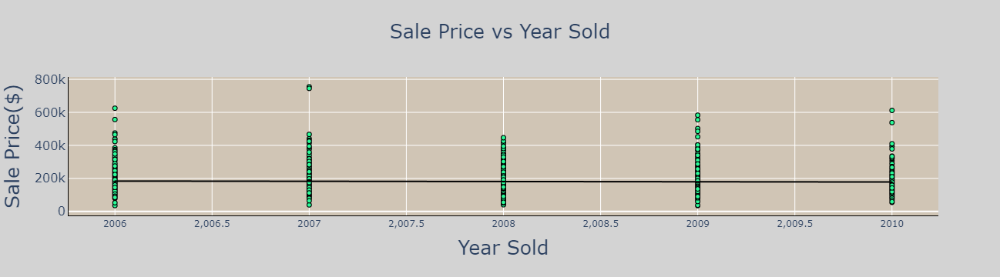

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.8420
Date:                Fri, 29 Apr 2022   Prob (F-statistic):              0.359
Time:                        16:33:03   Log-Likelihood:                -18314.
No. Observations:                1442   AIC:                         3.663e+04
Df Residuals:                    1440   BIC:                         3.664e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       3.082e+06   3.16e+06      0.975      0.3

In [557]:
fig = px.scatter(df, x= 'YrSold', y = 'SalePrice',color_discrete_sequence=['#2AFC98','#FF9FE5' ],
                  title = 'Sale Price vs Year Sold',                   
                 trendline='ols',
                 trendline_color_override="black"
                  )
fig.update_layout(
    xaxis_title = 'Year Sold',
    yaxis_title = 'Sale Price($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    paper_bgcolor = 'lightgray',
    bargap = 0.01,

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black'
    

    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  

    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig.show()
results = px.get_trendline_results(fig)
results = results.iloc[0]["px_fit_results"].summary()
print(results)

**That is the definition of no relationship**

In [558]:
df = df.drop(['YrSold'], axis = 1)
finalDF = finalDF.drop(['YrSold'], axis = 1)

In [559]:
get_vif()

,Feature,VIF,P-Value
0,MSSubClass,3.592945,5.384265e-04
1,LotFrontage,6.804980,6.645546e-06
2,LotArea,5.224951,2.243500e-02
3,OverallQual,74.570528,1.728499e-08
4,YearRemodAdd,126.554326,5.815174e-26
5,MasVnrArea,1.760908,1.309820e-02
6,ExterQual,102.799782,4.933878e-12
7,BsmtQual,38.141980,2.628076e-07
8,LowQualFinSF,1.059175,6.752538e-01
9,BedroomAbvGr,19.383677,3.282167e-01


## Convert MSSubClass into categorical

In [560]:
df['MSSubClass']=df['MSSubClass'].map(str)
finalDF['MSSubClass']=finalDF['MSSubClass'].map(str)

## Look at low quality finish square feet

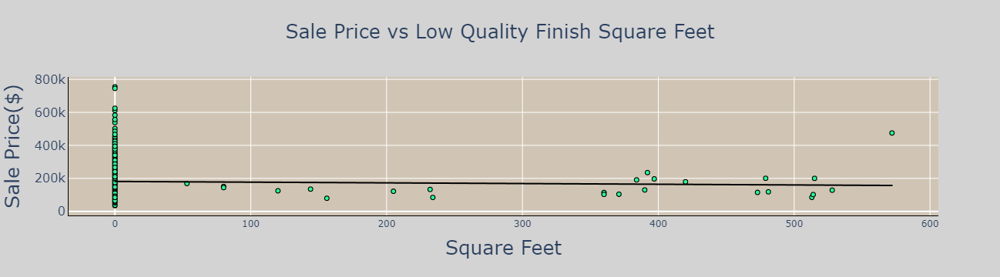

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.9797
Date:                Fri, 29 Apr 2022   Prob (F-statistic):              0.322
Time:                        16:33:03   Log-Likelihood:                -18314.
No. Observations:                1442   AIC:                         3.663e+04
Df Residuals:                    1440   BIC:                         3.664e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.814e+05   2106.501     86.098      0.0

In [561]:
fig = px.scatter(df, x= 'LowQualFinSF', y = 'SalePrice',color_discrete_sequence=['#2AFC98','#FF9FE5' ],
                  title = 'Sale Price vs Low Quality Finish Square Feet',                   
                 trendline='ols',
                 trendline_color_override="black"
                  )
fig.update_layout(
    xaxis_title = 'Square Feet',
    yaxis_title = 'Sale Price($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    paper_bgcolor = 'lightgray',
    bargap = 0.01,

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black'
    

    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  

    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig.show()
results = px.get_trendline_results(fig)
results = results.iloc[0]["px_fit_results"].summary()
print(results)

**No relationship, drop it**

In [562]:
df.drop(['LowQualFinSF'], axis =1, inplace = True)
finalDF.drop(['LowQualFinSF'], axis =1, inplace = True)

In [563]:
get_vif()

,Feature,VIF,P-Value
0,LotFrontage,6.776425,5.115942e-04
1,LotArea,5.221969,4.766686e-02
2,OverallQual,73.589939,1.160829e-08
3,YearRemodAdd,125.995140,6.397705e-24
4,MasVnrArea,1.746155,1.155498e-02
5,ExterQual,102.733234,6.239978e-11
6,BsmtQual,37.385155,2.820399e-07
7,BedroomAbvGr,19.272596,2.875342e-01
8,KitchenAbvGr,31.000691,1.060264e-02
9,KitchenQual,70.536287,3.438122e-05


## How about MasVnrArea?

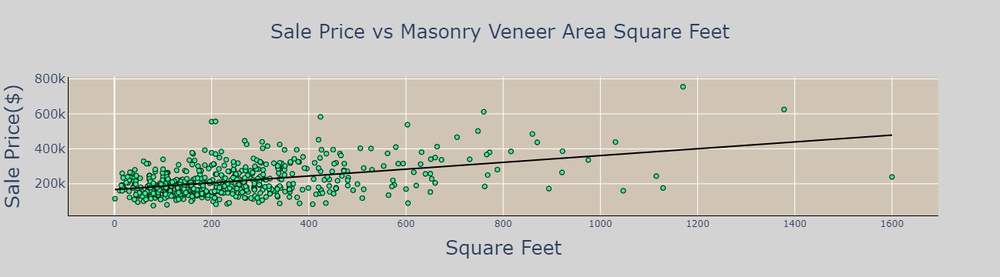

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.199
Model:                            OLS   Adj. R-squared:                  0.198
Method:                 Least Squares   F-statistic:                     144.6
Date:                Fri, 29 Apr 2022   Prob (F-statistic):           6.76e-30
Time:                        16:33:04   Log-Likelihood:                -7406.6
No. Observations:                 583   AIC:                         1.482e+04
Df Residuals:                     581   BIC:                         1.483e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.667e+05   5274.534     31.602      0.0

In [564]:
fig = px.scatter(df.loc[df['MasVnrArea']!=0], x= 'MasVnrArea', y = 'SalePrice',color_discrete_sequence=['#2AFC98','#FF9FE5' ],
                  title = 'Sale Price vs Masonry Veneer Area Square Feet',                   
                 trendline='ols',
                 trendline_color_override="black"
                  )
fig.update_layout(
    xaxis_title = 'Square Feet',
    yaxis_title = 'Sale Price($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    paper_bgcolor = 'lightgray',
    bargap = 0.01,

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black'
    

    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  

    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig.show()
results = px.get_trendline_results(fig)
results = results.iloc[0]["px_fit_results"].summary()
print(results)

**Relationship seems linear, keep it**

## Let's Look at our room count variables

In [565]:
dfRooms = df.loc[:, ['SalePrice', 'BedroomAbvGr', 'KitchenAbvGr', 'TotBr']]
dfRoomsMelt = pd.melt(dfRooms, id_vars = 'SalePrice')
dfRoomsMelt

,SalePrice,variable,value
0,208500,BedroomAbvGr,3.0
1,181500,BedroomAbvGr,3.0
2,223500,BedroomAbvGr,3.0
3,140000,BedroomAbvGr,3.0
4,250000,BedroomAbvGr,4.0
...,...,...,...
4321,175000,TotBr,2.5
4322,210000,TotBr,3.0
4323,266500,TotBr,2.0
4324,142125,TotBr,2.0


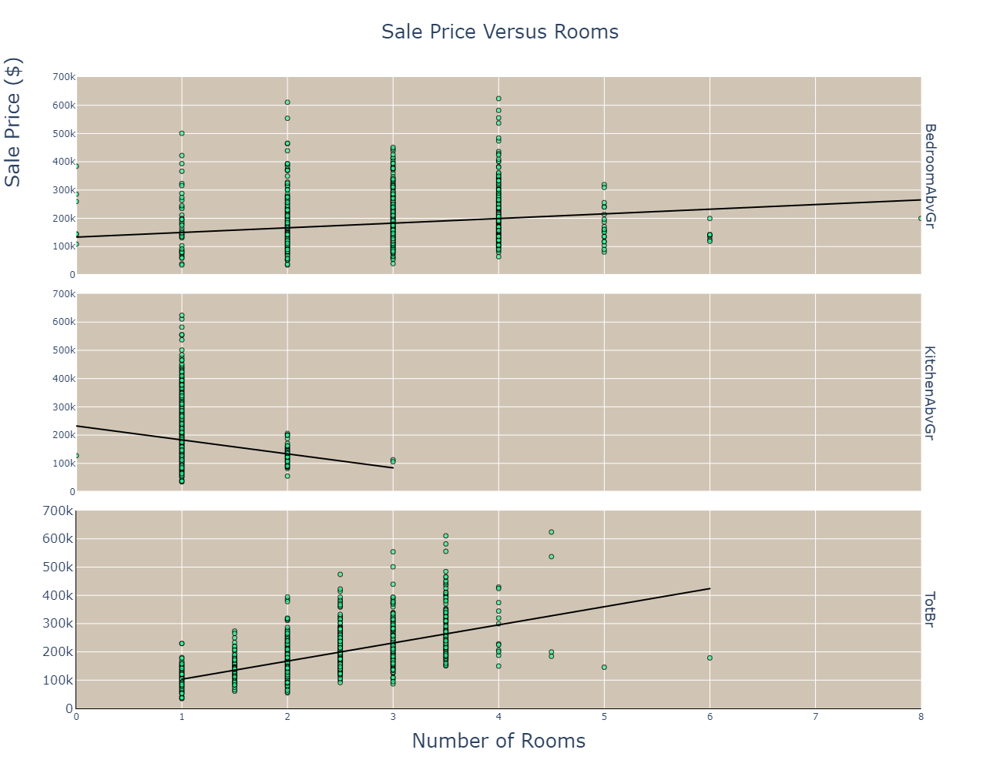

In [566]:
import plotly.graph_objects as go
fig = px.scatter(dfRoomsMelt, x = 'value', y ='SalePrice', facet_row = 'variable',title = 'Sale Price Versus Rooms',
                         color_discrete_sequence = ['#2AFC98', '#4B7F52','#DE541E', '#D67AB1', '#B20D30'],
                 width=1200, height=1000,
                 trendline='ols',
                 trendline_color_override="black",
                 opacity = 0.7,
                labels = {'variable':'Feature',                         
                         }
                )
for axis in fig.layout:
    if type(fig.layout[axis]) == go.layout.YAxis:
        fig.layout[axis].title.text = ''
    if type(fig.layout[axis]) == go.layout.XAxis:
        fig.layout[axis].title.text = ''
fig.update_layout(
    xaxis_title = 'Number of Rooms',
    yaxis_title = '.                                                                                                                                               Sale Price ($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
        title_standoff = 25,
        range = [0, 700000]
    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
        range = [0, 8]
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(
    marker=dict(size=6,
                line=dict(width=1,
                color='black')
               ),
    selector=dict(mode='markers')
)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))
fig.update_annotations(font_size=18, textangle=90)

fig

**I don't think number of bedrooms or kitchens are significant**

In [567]:
df.drop(['BedroomAbvGr', 'KitchenAbvGr'], axis = 1, inplace=True)
finalDF.drop(['BedroomAbvGr', 'KitchenAbvGr'], axis = 1, inplace=True)

In [568]:
get_vif()

,Feature,VIF,P-Value
0,LotFrontage,6.742698,1.014716e-04
1,LotArea,5.190728,2.977502e-02
2,OverallQual,72.422685,1.505175e-09
3,YearRemodAdd,54.635795,7.204177e-26
4,MasVnrArea,1.744141,8.519251e-03
5,ExterQual,101.168475,2.509383e-11
6,BsmtQual,34.343378,6.205972e-08
7,KitchenQual,69.213167,7.952455e-01
8,Fireplaces,2.630286,3.865454e-09
9,GarageCars,11.885210,5.954438e-06


## Let's check month sold

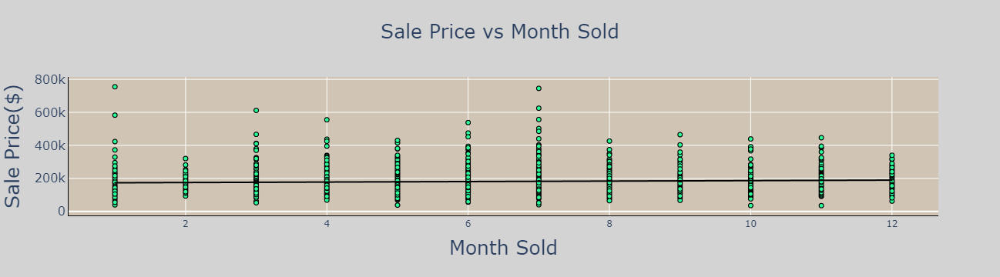

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     3.486
Date:                Fri, 29 Apr 2022   Prob (F-statistic):             0.0621
Time:                        16:33:04   Log-Likelihood:                -18313.
No. Observations:                1442   AIC:                         3.663e+04
Df Residuals:                    1440   BIC:                         3.664e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        1.72e+05   5315.863     32.354      0.0

In [569]:
fig = px.scatter(df, x= 'MoSold', y = 'SalePrice',color_discrete_sequence=['#2AFC98','#FF9FE5' ],
                  title = 'Sale Price vs Month Sold',                   
                 trendline='ols',
                 trendline_color_override="black"
                  )
fig.update_layout(
    xaxis_title = 'Month Sold',
    yaxis_title = 'Sale Price($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    paper_bgcolor = 'lightgray',
    bargap = 0.01,

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black'
    

    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  

    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig.show()
results = px.get_trendline_results(fig)
results = results.iloc[0]["px_fit_results"].summary()
print(results)

**Yeah, that doesn't matter**

In [570]:
df.drop(['MoSold'], axis =1, inplace = True)
finalDF.drop(['MoSold'], axis =1, inplace = True)

In [571]:
get_vif()

,Feature,VIF,P-Value
0,LotFrontage,6.742308,9.024055e-05
1,LotArea,5.190695,3.030670e-02
2,OverallQual,72.270373,1.519716e-09
3,YearRemodAdd,50.069378,1.025123e-25
4,MasVnrArea,1.742360,8.232118e-03
5,ExterQual,101.162736,1.959286e-11
6,BsmtQual,34.315502,6.051872e-08
7,KitchenQual,69.203359,7.775481e-01
8,Fireplaces,2.628780,4.305492e-09
9,GarageCars,11.884430,6.534773e-06


## How about fireplaces

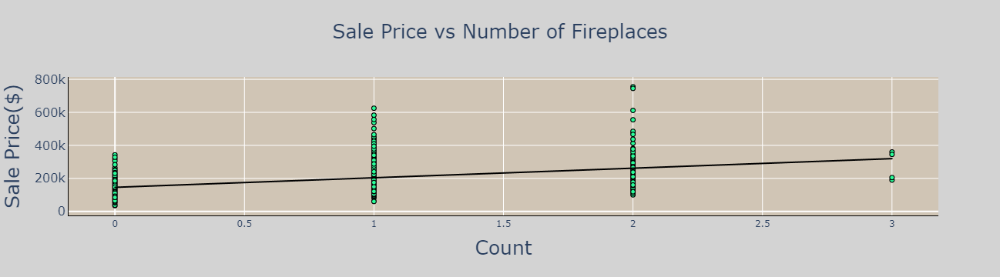

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.218
Model:                            OLS   Adj. R-squared:                  0.218
Method:                 Least Squares   F-statistic:                     402.4
Date:                Fri, 29 Apr 2022   Prob (F-statistic):           4.02e-79
Time:                        16:33:05   Log-Likelihood:                -18137.
No. Observations:                1442   AIC:                         3.628e+04
Df Residuals:                    1440   BIC:                         3.629e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.458e+05   2555.174     57.042      0.0

In [572]:
fig = px.scatter(df, x= 'Fireplaces', y = 'SalePrice',color_discrete_sequence=['#2AFC98','#FF9FE5' ],
                  title = 'Sale Price vs Number of Fireplaces',                   
                 trendline='ols',
                 trendline_color_override="black"
                  )
fig.update_layout(
    xaxis_title = 'Count',
    yaxis_title = 'Sale Price($)',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    paper_bgcolor = 'lightgray',
    bargap = 0.01,

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black'
    

    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  

    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='black')),
                  selector=dict(mode='markers'))
fig.show()
results = px.get_trendline_results(fig)
results = results.iloc[0]["px_fit_results"].summary()
print(results)

## Use Chi Squared Test to determine best categorical features

In [573]:
snip5 = get_vif()
snip5.loc[snip5['Feature'].isin([])]

,Feature,VIF,P-Value


In [574]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.preprocessing import OrdinalEncoder

### Create Encoded DF

In [575]:
catCols = [i for i in df.select_dtypes(['object'])]
oe = OrdinalEncoder()
oe.fit(df.loc[:,catCols])
dfEnc = pd.DataFrame(oe.transform(df.loc[:,catCols]))
dfEnc.columns = catCols


In [576]:
dfAllNumbers = pd.concat([df.select_dtypes(include=np.number).reset_index(), dfEnc], axis = 1)

In [577]:
fs = SelectKBest(score_func=chi2, k='all')
fs.fit(dfAllNumbers.drop(['SalePrice'], axis =1), dfAllNumbers.SalePrice)

SelectKBest(k='all', score_func=<function chi2 at 0x00000107D91E7E50>)

Feature 0: 153055.117246
Feature 1: 36977.186128
Feature 2: 10080440.692774
Feature 3: 370.523681
Feature 4: 185.328915
Feature 5: 289136.735297
Feature 6: 211.382708
Feature 7: 448.575407
Feature 8: 261.715824
Feature 9: 561.968990
Feature 10: 319.702485
Feature 11: 480871.556091
Feature 12: 7294690.912229
Feature 13: 292014.855203
Feature 14: 109421.989390
Feature 15: 288.537925
Feature 16: 896.768696
Feature 17: 1252.069792
Feature 18: 113.649121
Feature 19: 3.650480
Feature 20: 40.609047
Feature 21: 794.169516
Feature 22: 123.490081
Feature 23: nan
Feature 24: 551.284727
Feature 25: 888.245798
Feature 26: 2185.822023
Feature 27: 207.628309
Feature 28: 5.228688
Feature 29: 1942.365318
Feature 30: 801.357504
Feature 31: 350.467429
Feature 32: 1662.990789
Feature 33: 681.026444
Feature 34: 687.782898
Feature 35: 160.944678
Feature 36: 301.527784
Feature 37: 464.982854
Feature 38: 1844.442593
Feature 39: 1097.984850
Feature 40: 52.778305
Feature 41: 152.696987
Feature 42: 66.362091
Fea

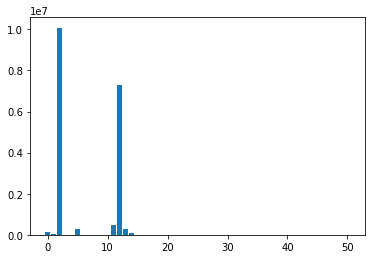

In [578]:
chiList = []
for i in range(len(fs.scores_)):
    print('Feature %d: %f' % (i, fs.scores_[i]))
    chiList.append(fs.scores_[i])
	
    
# plot the scores
plt.bar([i for i in range(len(fs.scores_))], fs.scores_)
plt.show()

In [579]:
chiDict = dict(zip(list(df.columns), chiList))
chiDict = {k:[v] for k,v in chiDict.items()}
dfChi = pd.DataFrame(chiDict)
dfChiMelt = pd.melt(dfChi.drop(['SalePrice'], axis =1))
dfChi = dfChiMelt.sort_values('value').iloc[0:20]
dfChi


,variable,value
19,RoofMatl,3.650480
28,Heating,5.228688
20,Exterior1st,40.609047
40,Fence,52.778305
42,MiscVal,66.362091
46,OutSq,76.325541
18,RoofStyle,113.649121
22,MasVnrType,123.490081
41,MiscFeature,152.696987
35,GarageType,160.944678


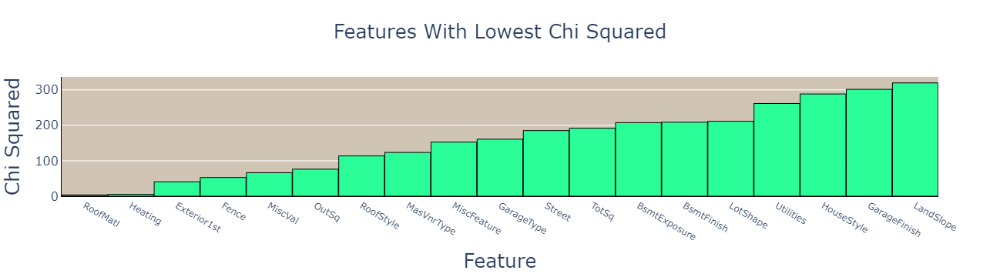

In [580]:
fig = px.bar(dfChi.loc[dfChi['variable']!='TotBr'], x = 'variable', y = 'value', color_discrete_sequence=['#2AFC98','#FF9FE5' ],
                  title = 'Features With Lowest Chi Squared',
                   labels = {
                       'variable':''
                   }
                  )
fig.update_layout(
    xaxis_title = 'Feature',
    yaxis_title = 'Chi Squared',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    bargap = 0.01,

    yaxis = dict(
        tickfont = dict(size=16),
        titlefont = dict(size = 25),
        linecolor = 'black',
    

    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
   
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(
    marker_line_width=1,
    marker_line_color="black"

)

**I think we can safely drop Roof Material, Fence, Exterior1st and Heating Features**

In [581]:
df.drop(['RoofMatl', 'Heating'], axis =1, inplace = True)
finalDF.drop(['RoofMatl', 'Heating'], axis =1, inplace = True)
df.drop(['Fence', 'Exterior1st'], axis =1, inplace = True)
finalDF.drop(['Fence', 'Exterior1st'], axis =1, inplace = True)


## Use Lasso Coefficients to drop variables

In [582]:
df.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'YearRemodAdd', 'RoofStyle', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'Foundation', 'BsmtQual', 'BsmtExposure',
       'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional',
       'Fireplaces', 'GarageType', 'GarageFinish', 'GarageCars', 'PavedDrive',
       'PoolArea', 'MiscFeature', 'MiscVal', 'SaleType', 'SaleCondition',
       'SalePrice', 'TotSq', 'OutSq', 'TotBr', 'BsmtFinish', 'RemodYN'],
      dtype='object')

In [583]:
df.drop(['MasVnrType', 'HeatingQC', 'MasVnrArea', 'LotFrontage', 'RemodYN', 'MSSubClass'], axis =1, inplace = True)
finalDF.drop(['MasVnrType', 'HeatingQC', 'MasVnrArea', 'LotFrontage', 'RemodYN', 'MSSubClass'], axis =1, inplace = True)
# Ensemble MAE 14373.814496354415
df.drop(['Exterior2nd','RoofStyle'], axis = 1, inplace = True)
finalDF.drop(['Exterior2nd','RoofStyle'], axis = 1, inplace = True)
# Ensemble MAE 14375.024081451304
df.drop(['BsmtQual','PoolArea'], axis = 1, inplace = True)
finalDF.drop(['BsmtQual','PoolArea'], axis = 1, inplace = True)
# Ensemble MAE 14093.860850241736
df.drop(['Utilities','MiscFeature', 'Alley', 'MSZoning'], axis = 1, inplace = True)
finalDF.drop(['Utilities','MiscFeature', 'Alley', 'MSZoning'], axis = 1, inplace = True)
# Ensemble MAE 14374




In [584]:
dfAllNumbers.drop(['RoofMatl', 'Heating'], axis = 1 , inplace = True)

In [585]:
def get_vif2():
    vif_data = pd.DataFrame()
    J = dfAllNumbers.drop(['SalePrice'], axis =1)
    J = J.select_dtypes(['number'])
    vif_data['Feature'] = J.columns
    vif_data['VIF'] = [vif(J.values, i) for i in range(len(J.columns))]
    vif_data
    X = dfAllNumbers.drop(['SalePrice'], axis = 1).select_dtypes(['number'])
    Y = dfAllNumbers.SalePrice
    X2 = sm.add_constant(X)
    est = sm.OLS(Y, X2)
    est2 = est.fit()
    pVals = pd.DataFrame()
    pVals['Feature'] = X.columns
    pVals['P-Value'] = [est2.pvalues[i]for i in range(len(X.columns))]
    pVals
    return(pd.merge(vif_data, pVals, on='Feature'))

In [586]:
get_vif2()

C:\Users\jmeis\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1740: RuntimeWarning:

invalid value encountered in double_scalars



,Feature,VIF,P-Value
0,index,4.120034,2.503940e-02
1,LotFrontage,7.340885,6.501036e-01
2,LotArea,5.634895,5.851787e-03
3,OverallQual,78.318178,1.695008e-07
4,YearRemodAdd,920.101136,7.673064e-24
5,MasVnrArea,2.171040,2.740227e-01
6,ExterQual,117.958060,9.439167e-16
7,BsmtQual,41.624200,3.968601e-05
8,KitchenQual,74.357581,6.681533e-01
9,Fireplaces,2.846999,7.592660e-08


In [587]:
dfAllNumbers.Utilities.value_counts()

0.0    1442
Name: Utilities, dtype: int64

In [588]:
df.columns

Index(['LotArea', 'Street', 'LotShape', 'LandContour', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'YearRemodAdd', 'ExterQual', 'Foundation',
       'BsmtExposure', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional',
       'Fireplaces', 'GarageType', 'GarageFinish', 'GarageCars', 'PavedDrive',
       'MiscVal', 'SaleType', 'SaleCondition', 'SalePrice', 'TotSq', 'OutSq',
       'TotBr', 'BsmtFinish'],
      dtype='object')

## Scale Numerical Values

In [589]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df.select_dtypes(['number']).drop(['SalePrice'],axis =1))
scaledDF = pd.DataFrame(scaled_data)
scaledDF.columns = df.select_dtypes(['number']).drop(['SalePrice'], axis =1).columns
df = pd.concat([scaledDF, df.select_dtypes(['object']).reset_index(), df.SalePrice.reset_index()], axis = 1).drop(['index'], axis =1)

In [590]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(finalDF.select_dtypes(['number']))
scaledDF = pd.DataFrame(scaled_data)
scaledDF.columns = finalDF.select_dtypes(['number']).columns
finalDF = pd.concat([scaledDF, finalDF.select_dtypes(['object']).reset_index()], axis = 1).drop(['index'], axis =1)

## Create Dummy Columns and output CSV V1.5

In [591]:
# List of Categorical columns

catCols = [i for i in df.select_dtypes(['object'])]
catCols


['Street',
 'LotShape',
 'LandContour',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'Foundation',
 'BsmtExposure',
 'CentralAir',
 'Electrical',
 'Functional',
 'GarageType',
 'GarageFinish',
 'PavedDrive',
 'SaleType',
 'SaleCondition']

In [592]:
version = '1.5'
df.to_csv('../data/Version_1.5/FullSmartVersion_1.5.csv')



In [593]:
from sklearn.model_selection import train_test_split
XS_train, XS_test, ys_train, ys_test = train_test_split(df.drop(['SalePrice'], axis = 1),df['SalePrice'] , test_size=0.3, shuffle = True, random_state=1)


In [594]:
X_train = pd.get_dummies(XS_train, columns = catCols, drop_first=True)
X_test = pd.get_dummies(XS_test, columns = catCols, drop_first=True)
finalSmartDF = finalDF
finalDF = pd.get_dummies(finalDF, columns = catCols, drop_first=True)

In [595]:
y_train=ys_train
y_test=ys_test

In [596]:
X_train.to_csv('C:/Users/jmeis/NYC_DSA/HousingPrices/Data/Version_1.5/x_Train.csv', index=False)
X_test.to_csv('C:/Users/jmeis/NYC_DSA/HousingPrices/Data/Version_1.5/x_Test.csv', index=False)
y_train.to_csv('C:/Users/jmeis/NYC_DSA/HousingPrices/Data/Version_1.5/y_Train.csv', index=False)
y_test.to_csv('C:/Users/jmeis/NYC_DSA/HousingPrices/Data/Version_1.5/y_Test.csv', index=False)
finalDF.to_csv('../data/Version_1.5/TestDumbVersion_1.5.csv')

## Perform Label Encoding on XS data sets

In [597]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
XS2train = XS_train.select_dtypes(['object']).apply(le.fit_transform)
XS2test = XS_test.select_dtypes(['object']).apply(le.fit_transform)
Final2DF = finalSmartDF.select_dtypes(['object']).apply(le.fit_transform)
XS_train = pd.concat([XS_train.select_dtypes(['number']), XS2train],axis = 1)
XS_test = pd.concat([XS_test.select_dtypes(['number']), XS2test],axis = 1)
finalSmartDF = pd.concat([finalSmartDF.select_dtypes(['number']), Final2DF],axis = 1)

In [598]:
XS_train.to_csv('C:/Users/jmeis/NYC_DSA/HousingPrices/Data/Version_1.5/xs_Train.csv', index=False)
XS_test.to_csv('C:/Users/jmeis/NYC_DSA/HousingPrices/Data/Version_1.5/xs_Test.csv', index=False)
ys_train.to_csv('C:/Users/jmeis/NYC_DSA/HousingPrices/Data/Version_1.5/ys_Train.csv', index=False)
ys_test.to_csv('C:/Users/jmeis/NYC_DSA/HousingPrices/Data/Version_1.5/ys_Test.csv', index=False)
finalSmartDF.to_csv('../Data/Version_1.5/TestSmartVersion_1.5.csv', index=False)

### Create Feature List Text file

In [599]:
with open('C:/Users/jmeis/NYC_DSA/HousingPrices/Data/Version_1.4/FeatureExplanation.txt', 'w') as f:
    f.write('Feature Explanation\n\
            Dropped Low Count Categorical Values\n\
            Created 3 new metrics for total indor square footage, total outdoor square footage, and total bathrooms, dropped other columns\n\
            Created a combined quality and condition variabel weighted by correlation to target\n\
            Changed nominal categorical values to ordinal\n\
            Created dummy variables and dropped first, sampled by shuffle\n\
            Converted GarageYrBlt to numeric, and changed None values to 0\n\
            Deleted basement finished and unfinished columns, created a percent finished col\n\
            Deleted Years House Remodeled, and Year House Built\n\
            Deleted Garage Area, has the same info as garage number of cars\n\
            Deleted Garage Year Built, not relevant\n\
            Converted MSSubClass to string (categorical)'            
           )

In [600]:
XS_train.columns

Index(['LotArea', 'OverallQual', 'YearRemodAdd', 'ExterQual', 'KitchenQual',
       'Fireplaces', 'GarageCars', 'MiscVal', 'TotSq', 'OutSq', 'TotBr',
       'BsmtFinish', 'Street', 'LotShape', 'LandContour', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'Foundation', 'BsmtExposure', 'CentralAir', 'Electrical',
       'Functional', 'GarageType', 'GarageFinish', 'PavedDrive', 'SaleType',
       'SaleCondition'],
      dtype='object')

In [622]:
dfOb = df.select_dtypes('object').apply(le.fit_transform)
dfOb.columns

Index(['Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'Foundation', 'BsmtExposure', 'CentralAir', 'Electrical', 'Functional',
       'GarageType', 'GarageFinish', 'PavedDrive', 'SaleType',
       'SaleCondition'],
      dtype='object')

In [623]:
dfNum = df.select_dtypes('number')
dfNum.columns

Index(['LotArea', 'OverallQual', 'YearRemodAdd', 'ExterQual', 'KitchenQual',
       'Fireplaces', 'GarageCars', 'MiscVal', 'TotSq', 'OutSq', 'TotBr',
       'BsmtFinish', 'SalePrice'],
      dtype='object')

In [603]:
pd.concat([dfOb, dfNum], axis = 1)

,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,...,ExterQual,KitchenQual,Fireplaces,GarageCars,MiscVal,TotSq,OutSq,TotBr,BsmtFinish,SalePrice
0,1,3,3,4,0,5,2,2,0,5,...,1.054105,0.733018,-0.953275,0.311284,-0.082009,0.008615,-0.766731,1.653197,0.935975,208500
1,1,3,3,2,0,24,1,2,0,2,...,-0.695054,-0.774845,0.608796,0.311284,-0.082009,-0.045015,0.752770,0.371525,0.512215,181500
2,1,0,3,4,0,5,2,2,0,5,...,1.054105,0.733018,0.608796,0.311284,-0.082009,0.187384,-0.888548,1.653197,0.935975,223500
3,1,0,3,0,0,6,2,2,0,5,...,-0.695054,0.733018,0.608796,1.651201,-0.082009,-0.110138,0.810473,-0.269311,0.512215,140000
4,1,0,3,2,0,15,2,2,0,5,...,1.054105,0.733018,0.608796,1.651201,-0.082009,1.000781,0.611720,1.653197,0.935975,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1437,1,3,3,4,0,8,2,2,0,5,...,-0.695054,-0.774845,0.608796,0.311284,-0.082009,0.052030,-0.901371,0.371525,-1.182826,175000
1438,1,3,3,4,0,14,2,2,0,2,...,-0.695054,-0.774845,2.170866,0.311284,-0.082009,1.348102,1.079752,1.012361,1.359736,210000
1439,1,3,3,4,0,6,2,2,0,5,...,2.803264,0.733018,2.170866,-1.028632,5.523195,1.191041,-0.773143,-0.269311,0.935975,266500
1440,1,3,3,4,0,12,2,2,0,2,...,-0.695054,0.733018,-0.953275,-1.028632,-0.082009,-0.514921,1.906822,-0.269311,1.783496,142125


In [604]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

In [605]:
logit = Lasso()

In [606]:
logit.fit(XS_train, ys_train)

Lasso()

In [607]:
parametersGrid = {
                "alpha": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]
                }
logit = Lasso(normalize=True)
gridLasso = GridSearchCV(logit, parametersGrid, scoring='r2', cv=10, n_jobs = -1)
gridLasso.fit(XS_train, ys_train)
predLasso = gridLasso.predict(XS_test)

C:\Users\jmeis\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 



In [608]:
LassoDF = pd.DataFrame(gridLasso.best_estimator_.coef_)
G = pd.concat([pd.Series(XS_train.columns), LassoDF], axis = 1)
G.columns = ['Feature', 'Lasso Coefficient']
G.sort_values('Lasso Coefficient')

,Feature,Lasso Coefficient
19,Condition2,-5412.870705
20,BldgType,-4258.135249
28,GarageFinish,-3320.478003
23,BsmtExposure,-2194.886006
25,Electrical,-2095.906225
13,LotShape,-768.377521
18,Condition1,-484.596928
15,LotConfig,-304.992952
30,SaleType,-7.104465
21,HouseStyle,341.621995


In [612]:
GG = G.sort_values('Lasso Coefficient').loc[G['Feature'].isin(dfNum.columns)]

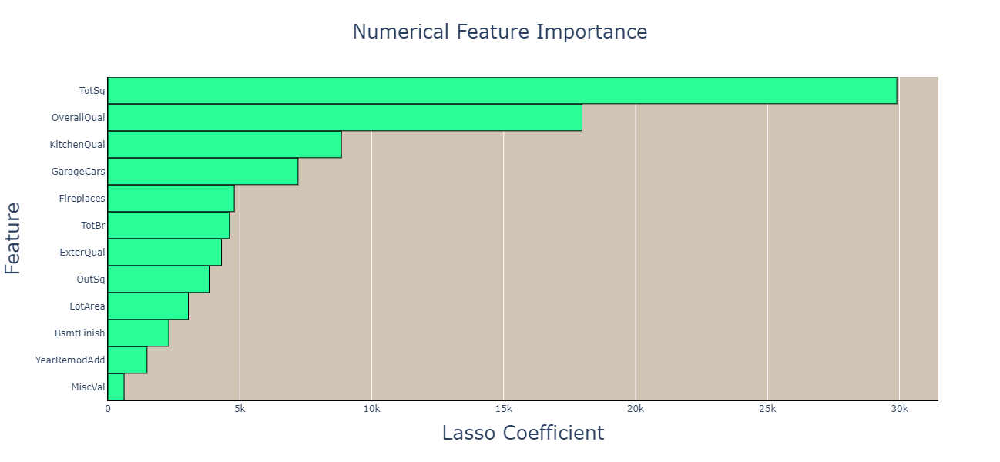

In [618]:
fig = px.bar(GG, x = 'Lasso Coefficient', y = 'Feature', color_discrete_sequence=['#2AFC98','#FF9FE5' ],
                  title = 'Numerical Feature Importance',
             height = 600,
             width = 1200,
             
                   labels = {
                       'variable':''
                   }
                  )
fig.update_layout(
    xaxis_title = 'Lasso Coefficient',
    yaxis_title = 'Feature',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    bargap = 0.01,

    yaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size = 25),
        linecolor = 'black',
    

    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
   
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(
    marker_line_width=1,
    marker_line_color="black"

)

In [619]:
GG2 = G.sort_values('Lasso Coefficient').loc[G['Feature'].isin(dfOb.columns)]

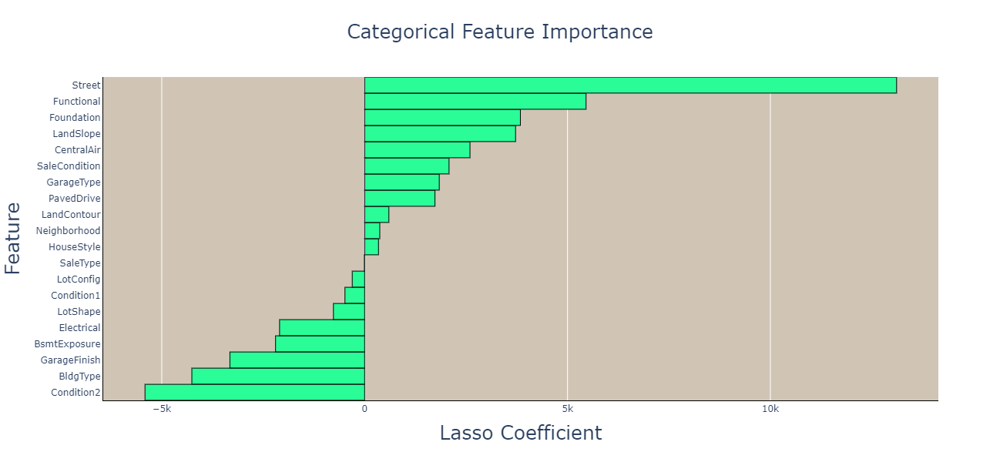

In [621]:
fig = px.bar(GG2, x = 'Lasso Coefficient', y = 'Feature', color_discrete_sequence=['#2AFC98','#FF9FE5' ],
                  title = 'Categorical Feature Importance',
             height = 600,
             width = 1200,
             
                   labels = {
                       'variable':''
                   }
                  )
fig.update_layout(
    xaxis_title = 'Lasso Coefficient',
    yaxis_title = 'Feature',
    title_x=0.5,
    plot_bgcolor = '#d0c5b5',
    title_font = dict(size = 25),
    bargap = 0.01,

    yaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size = 25),
        linecolor = 'black',
    

    ),
    xaxis = dict(
        tickfont = dict(size=12),
        titlefont = dict(size =25),
        linecolor = 'black'  ,
   
    ),
    legend=dict(
        yanchor='top',
        y = .98,
        xanchor='right',
        x = 0.98
    )   
)
fig.update_traces(
    marker_line_width=1,
    marker_line_color="black"

)